In [1]:
import sys
import os

if '..//..//' not in sys.path:
    sys.path.append('..//../')

from opmsim.optical_system_base import OpticalSystem
from opmsim import optical_elements
from opmsim import dipole_source
import numpy as np
from matplotlib import pyplot as plt


## Element setup and save paths

In [2]:
optical_elements

<module 'opmsim.optical_elements' from 'C:\\Users\\lnr19\\code\\oldversions\\OPMsim\\notebooks\\Simulation setups\\..//..\\opmsim\\optical_elements.py'>

In [14]:
savepath = "C:/Users/lnr19/OneDrive - Imperial College London/thesis/for _thesis/modelling/pupils/"
savepath = "C:/Users/lnr19/OneDrive - Imperial College London/postdoc_2024/Hugh Paper/old_code/"


savepath_full = os.path.join(savepath, "dOPM_thorlabs2_old_newtl")
if not os.path.exists(savepath_full):
    os.makedirs(savepath_full)
save_filename = os.path.join(savepath_full,'collection_efficiency.txt')
save_details = os.path.join(savepath_full,'sim_details.txt')


# setup
# O1
M_O1 = 60
NA_O1 = 1.2
n_O1 =1.33
f_TL1 = 0.2  # Nikon
f_O1 = f_TL1/M_O1

# O2
M_O2 = 50
NA_O2 = 0.95
f_TL2 = 0.162406015 # 0.162 #0.15#0.180  # Olympus
f_O2 = 0.180/M_O2

perfect_mirror = False
retardance = True  # false to ignore retardance effect
film_mat = "SiO"
# film_mat = "perfect mirror"
film_ri = "../../refractive_index_data/"+film_mat+".txt"
film_thickness = 131e-9 # 161e-9 # 131e-9

opm_angles = [0, 35, 45]


In [15]:
dipole_count = 7500

options = {
    'ray_count': 10000,
    'draw_rays': False,
    'max_rays_stored': 10000,
}

plot_options = {
    'title': 'Pupil intensity at final image plane of dOPM microscope',
    'add_sim_details': True,
    'max_r_in': 0,
    'scale_range': None# [0,0.3]
}

#opm_angle = 35*np.pi/180

O1 = optical_elements.SineLens(NA=NA_O1, focal_length=f_O1, n=n_O1)
TL1 = optical_elements.SineLens(NA=0.1, focal_length=f_TL1, n=1)
O2 = optical_elements.SineLens(NA=NA_O2, focal_length=f_O2, n=1)
TL2 = optical_elements.SineLens(NA=0.1, focal_length=f_TL2, n=1)

diag = optical_elements.DiagonalMatrix(-1)

QWP = optical_elements.WavePlate(np.pi/4, np.pi/2)
QWP2 = optical_elements.WavePlate(-np.pi/4, np.pi/2)

LP = optical_elements.LinearPolariser(np.pi/2)
LP2 = optical_elements.LinearPolariser(0)


Ag_mirror = lambda opm_angle: optical_elements.FlatMirror(opm_angle*np.pi/360, film_thickness,\
                                            fresnel_debug_savedir="C:/Users/lnr19/code/OPMsim/output",
                                            n_metal_file = "../../refractive_index_data/Ag.txt",\
                                            n_film_file = film_ri, perfect_mirror=perfect_mirror,\
                                            retardance=retardance)

perf_mirror = lambda opm_angle: optical_elements.FlatMirror(opm_angle*np.pi/360, film_thickness,\
                                            fresnel_debug_savedir="C:/Users/lnr19/code/OPMsim/output",
                                            n_metal_file = "../../refractive_index_data/Ag.txt",\
                                            n_film_file = film_ri, perfect_mirror=True)

elements_fun = lambda opm_angle: [O1, TL1, TL2, LP, QWP, O2, Ag_mirror(opm_angle), O2, QWP, LP2]
elements_s_fun = lambda opm_angle: [O1, TL1, TL2, LP2, QWP, O2, Ag_mirror(opm_angle), O2, QWP, LP]

elements_perf_fun = lambda opm_angle: [O1, TL1, TL2, LP, QWP, O2, perf_mirror(opm_angle), O2, QWP, LP2]
elements_perf_s_fun = lambda opm_angle: [O1, TL1, TL2, LP2, QWP, O2, perf_mirror(opm_angle), O2, QWP, LP]

#elements_fun = lambda opm_angle: [O1, TL1, TL2, LP, QWP, O2, O2, QWP, LP2]
#elements_s_fun = lambda opm_angle: [O1, TL1, TL2, LP2, QWP, O2, O2, QWP, LP]

s_pol = lambda opm_angle: (0, (90-opm_angle)*np.pi/180)
p_pol = (np.pi/2,0)

plot_options_p = plot_options; plot_options_s = plot_options; plot_options_un = plot_options;
plot_options_p['scale_range'] = [0,3,4]
plot_options_s['scale_range'] = [0,3,4]
plot_options_un['scale_range'] = [0,7,5]

In [11]:
type(O1).__name__

'SineLens'

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


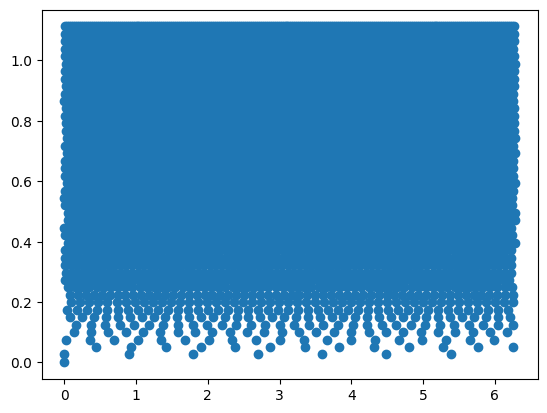

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 4.188790708032343
initial_energy 2.382624774981475
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 36.074773s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

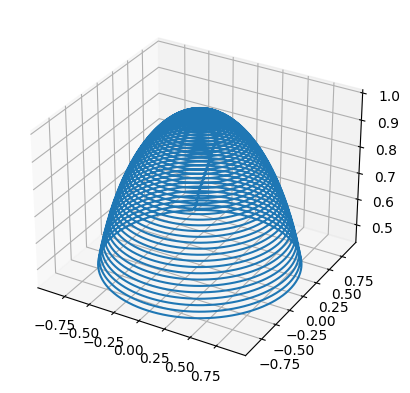

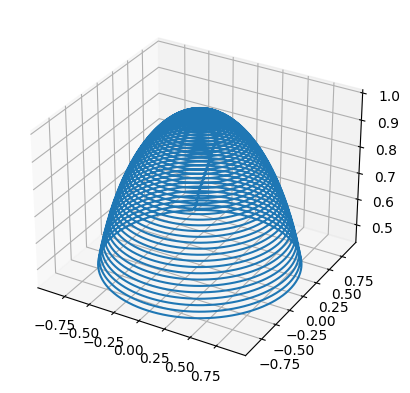

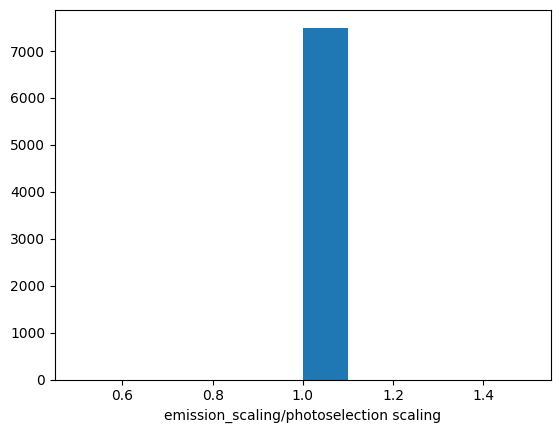

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.3593133076812813
Total energy per dipole per ray: 0.8561087888619623
Energy from Ix 1403.7452162352347
Energy from Iy 1.977809723540746e-30
X/Y energy ratio = 7.097473531084678e+32
Half sphere energy 4.188790708032343
Initial energy 2.382624774981475
half sphere energy NA 2.3825777265821206
maxr 0.004
0 escaped out of 5860
Saved checkpoint with 10000 rays
0 escaped out of 5860
time in trace_rays 69.202767s
ray count 5860
max Ix 4.750846797362715
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.003228711639216003
max_r_reduced 0.0032286714653977605 max_r 0.003228711639216003


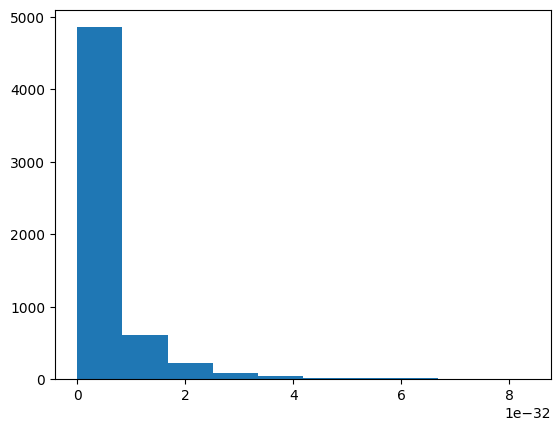

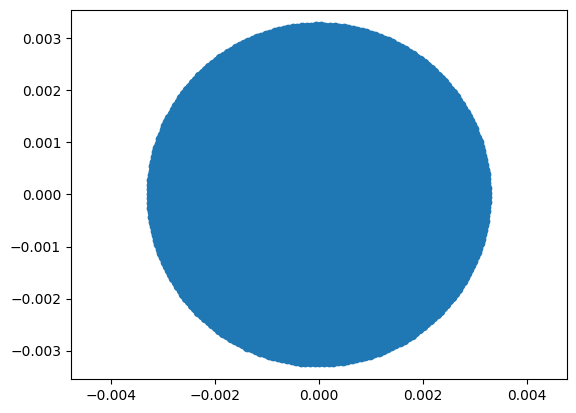

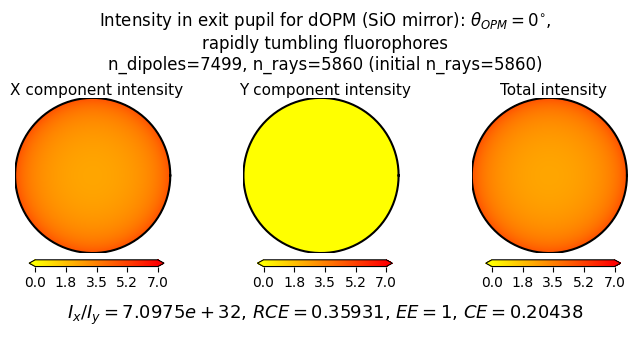

ray count 5860
max Ix 3.333547387795266
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968531850403161 max_r 0.896864344434275


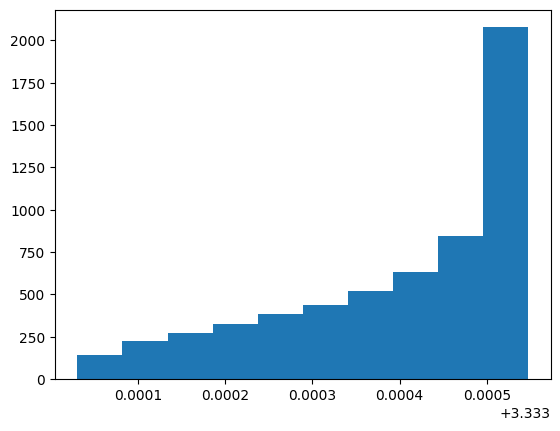

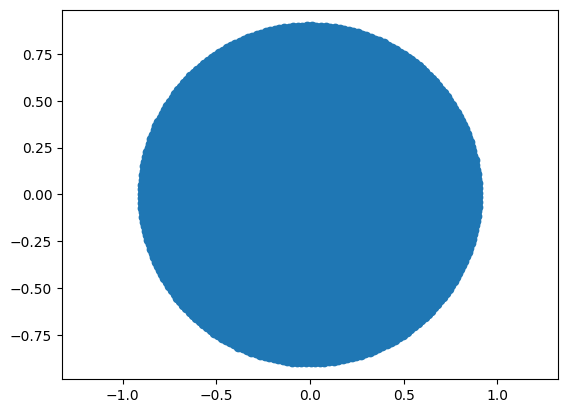

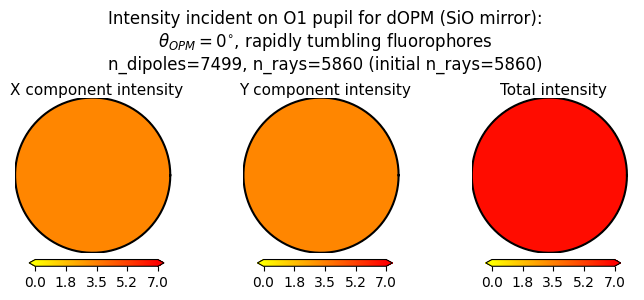

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


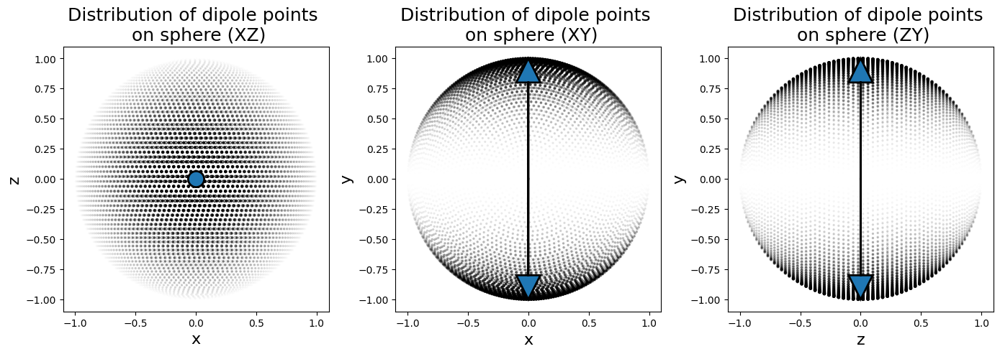

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


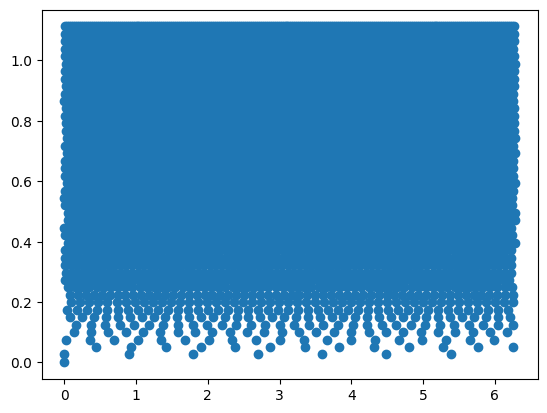

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.397507898300317
initial_energy 0.843768519240068
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 34.782252s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

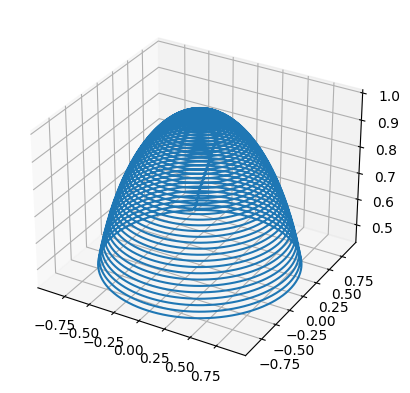

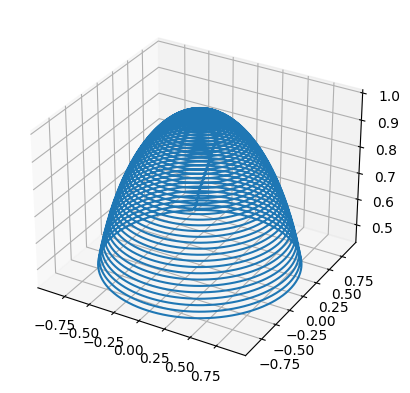

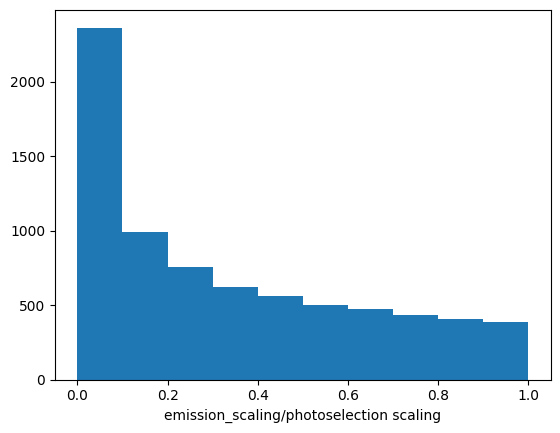

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.5124462322348023
Total energy per dipole per ray: 0.43238599856291116
Energy from Ix 708.9750566123985
Energy from Iy 9.873247452929777e-31
X/Y energy ratio = 7.180768637597733e+32
Half sphere energy 1.397507898300317
Initial energy 0.843768519240068
half sphere energy NA 0.794900347928106
maxr 0.004
0 escaped out of 5860
Saved checkpoint with 10000 rays
0 escaped out of 5860
time in trace_rays 68.871720s
ray count 5860
max Ix 2.8517273736672397
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.003228711639216003
max_r_reduced 0.0032286714653977605 max_r 0.003228711639216003


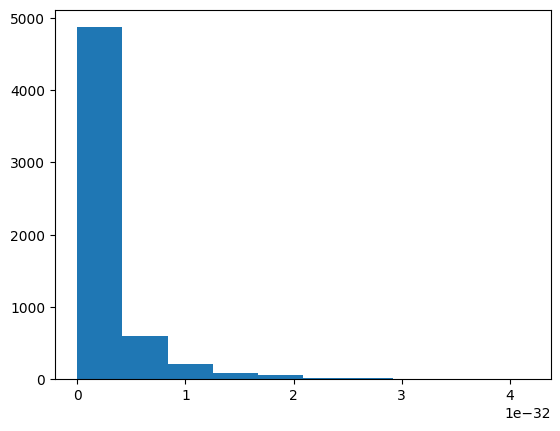

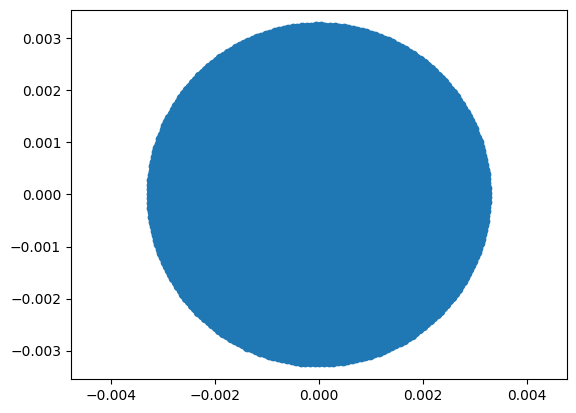

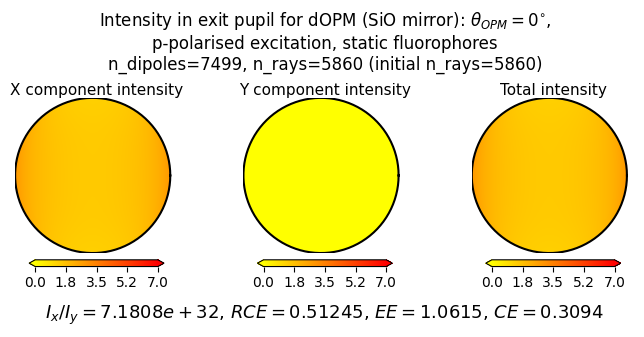

ray count 5860
max Ix 0.7707313751231928
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968531850403161 max_r 0.896864344434275


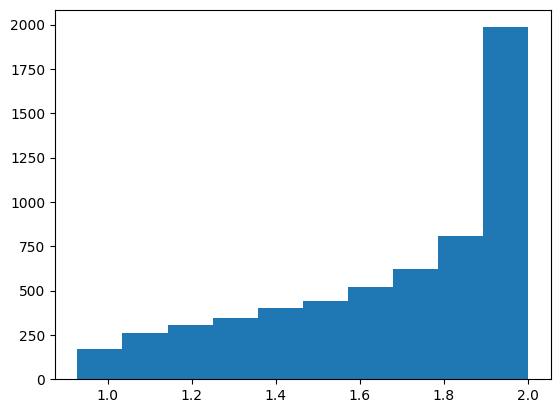

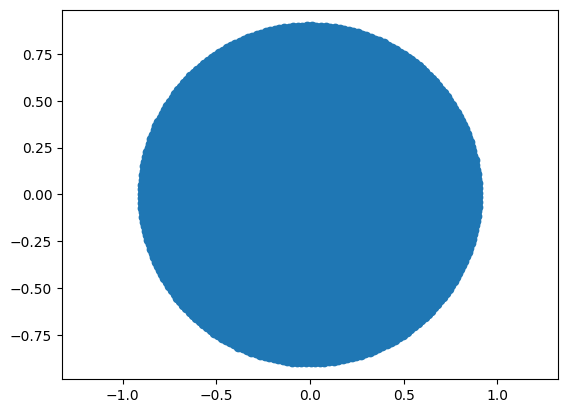

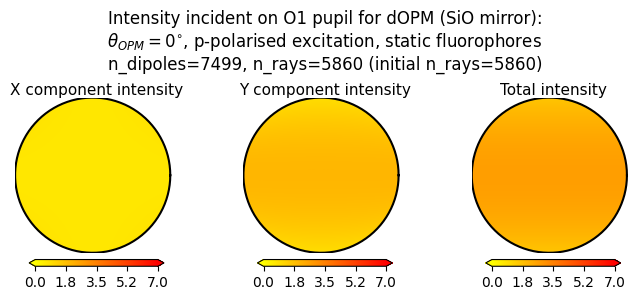

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


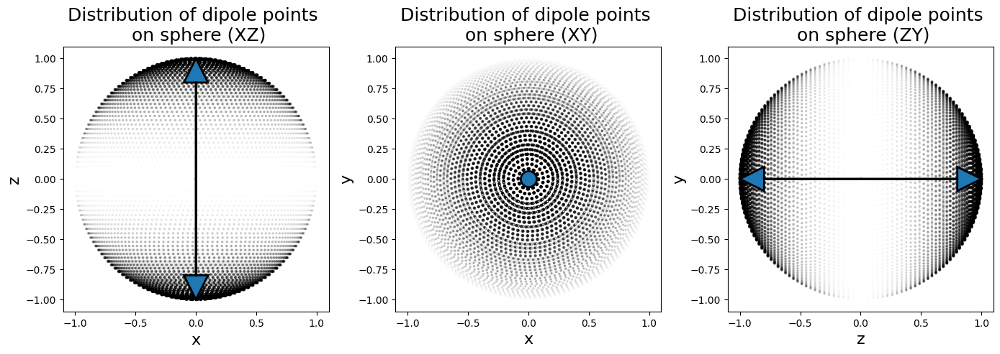

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


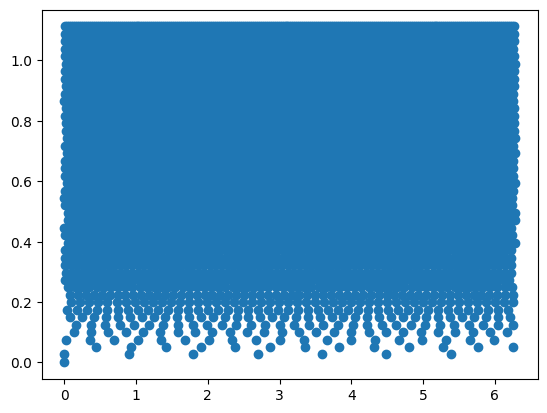

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.394998811439359
initial_energy 0.6958266863837751
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 31.251789s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT

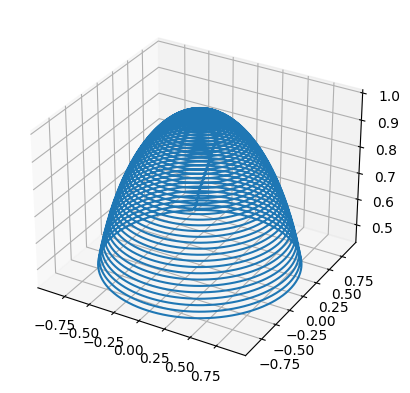

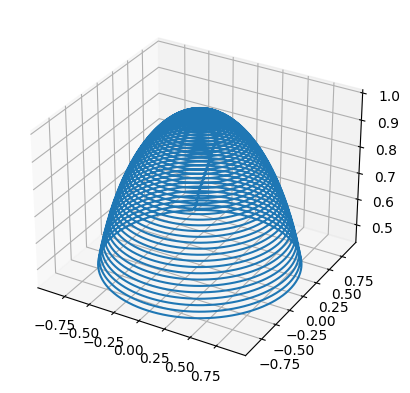

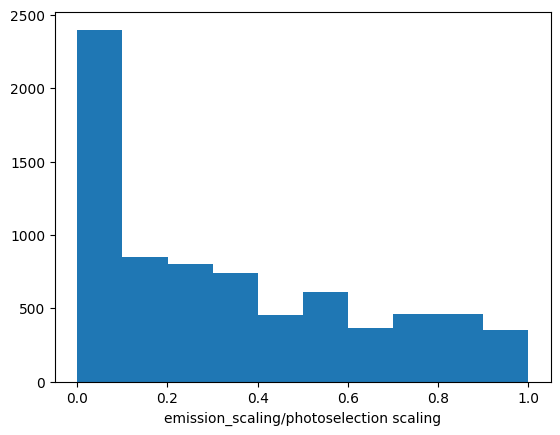

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.35681557187256857
Total energy per dipole per ray: 0.24828179702622113
Energy from Ix 2.7126482963918723e-30
Energy from Iy 407.10291657809506
X/Y energy ratio = 6.663298605652464e-33
Half sphere energy 1.394998811439359
Initial energy 0.6958266863837751
half sphere energy NA 0.7934731831720547
maxr 0.004
0 escaped out of 5860
Saved checkpoint with 10000 rays
0 escaped out of 5860
time in trace_rays 66.690547s
ray count 5860
max Ix 1.3893080188413736e-31
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.003228711639216003
max_r_reduced 0.0032286714653977605 max_r 0.003228711639216003


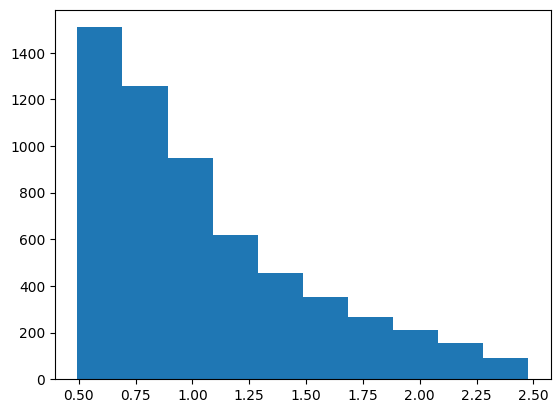

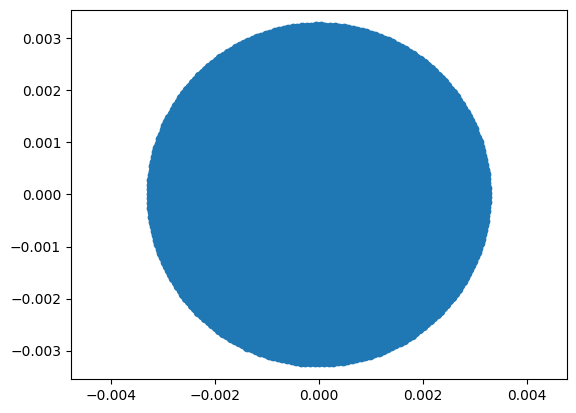

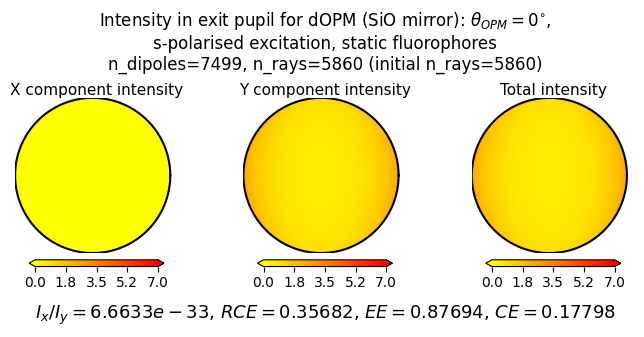

ray count 5860
max Ix 1.7387453587440955
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968531850403161 max_r 0.896864344434275


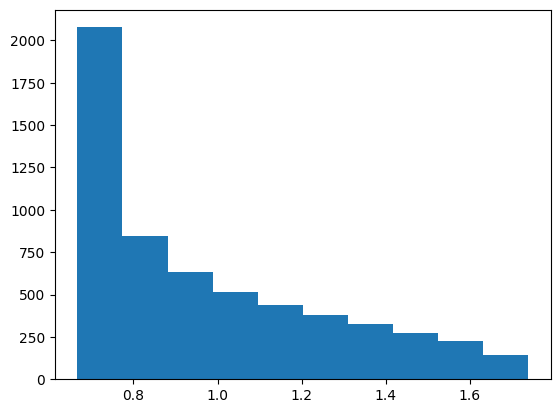

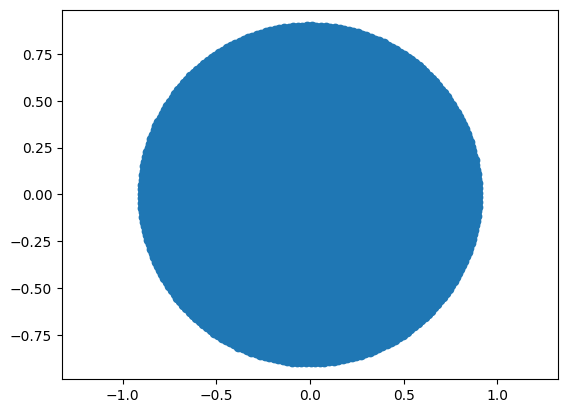

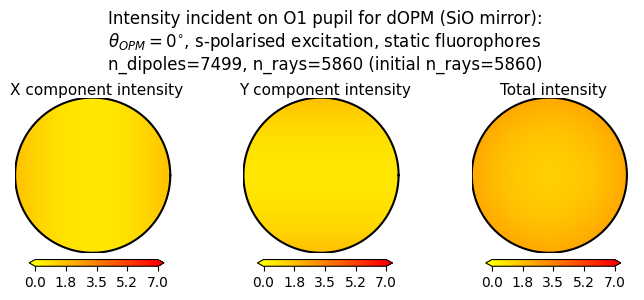

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


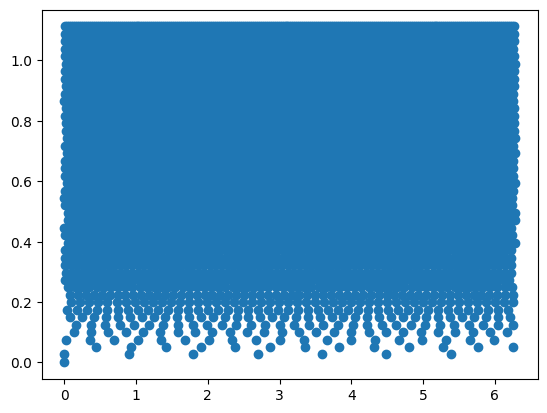

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 4.188790708032343
initial_energy 2.382624774981475
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 35.840588s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

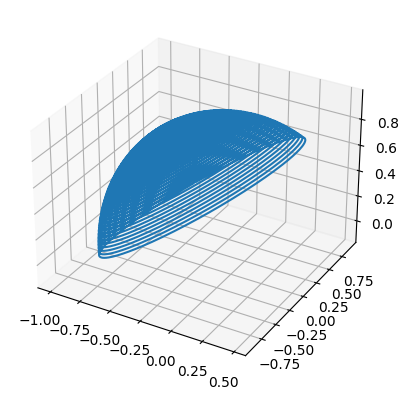

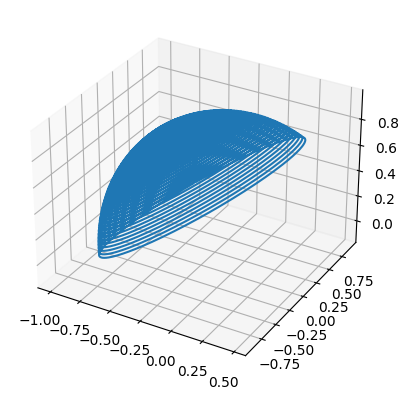

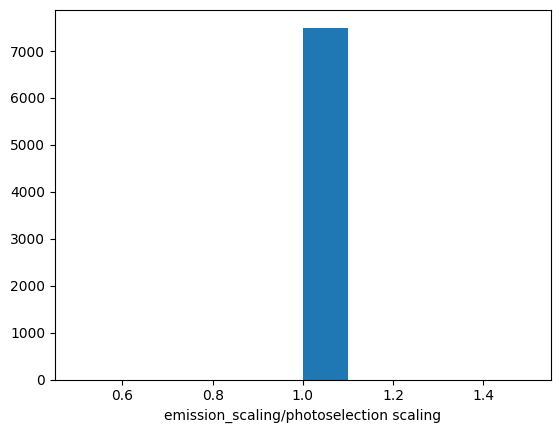

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.2862956323270099
Total energy per dipole per ray: 0.682135066551321
Energy from Ix 1118.4838293397233
Energy from Iy 1.6422992405710418e-30
X/Y energy ratio = 6.810475227101834e+32
Half sphere energy 4.188790708032343
Initial energy 2.382624774981475
half sphere energy NA 2.3825777265821206
maxr 0.004
1276 escaped out of 5860
Saved checkpoint with 10000 rays
1276 escaped out of 5860
time in trace_rays 63.337186s
ray count 4584
max Ix 7.454520259154078
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034129727863418872
max_r_reduced 0.0034128094937634404 max_r 0.0034129727863418872


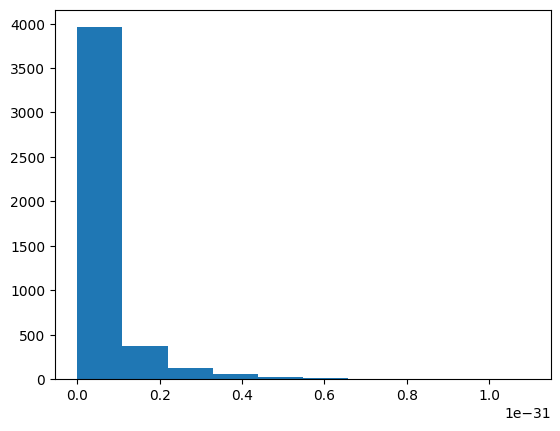

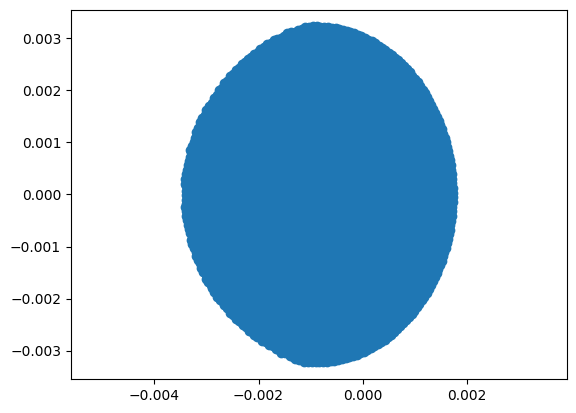

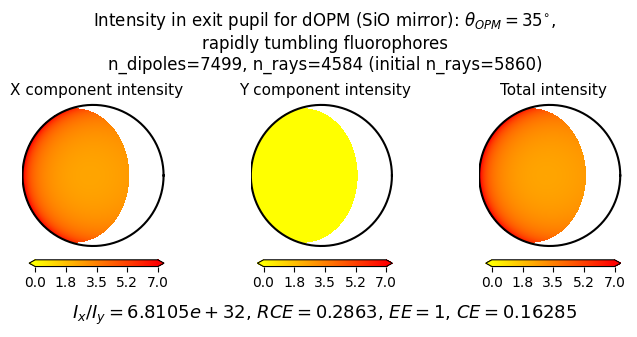

ray count 4584
max Ix 3.333547387795266
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968373351347638 max_r 0.896864344434275


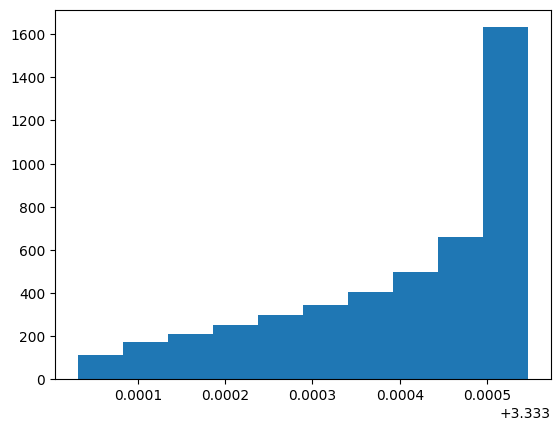

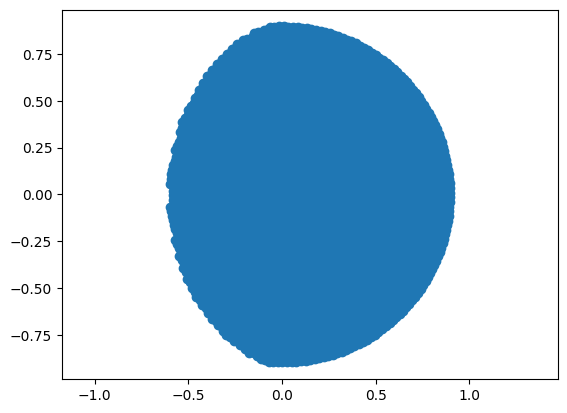

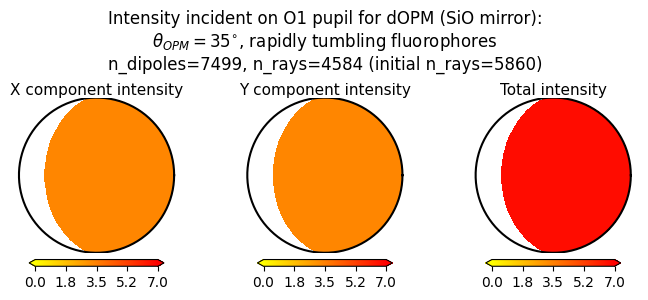

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


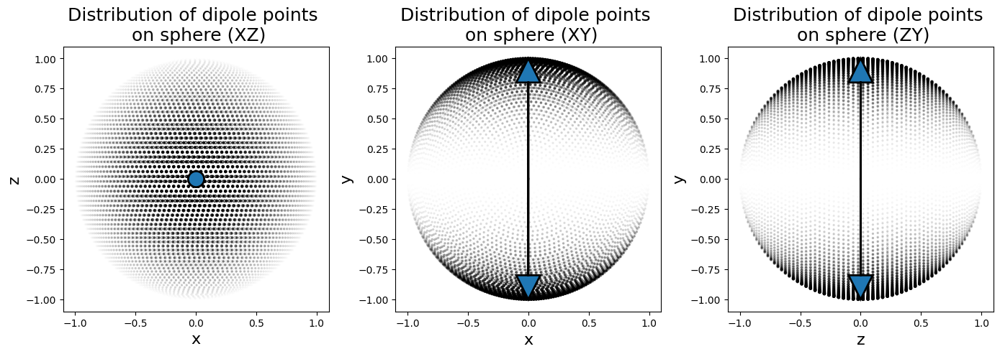

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


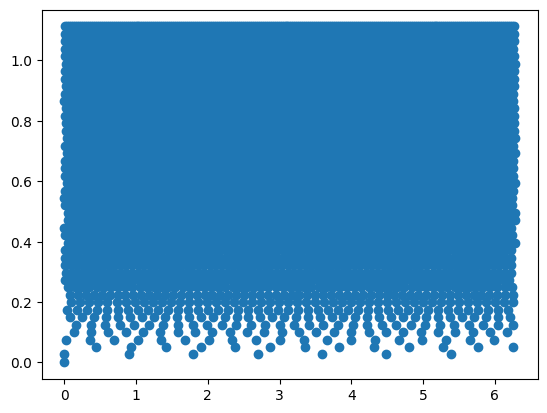

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.397507898300317
initial_energy 0.843768519240068
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 33.428893s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

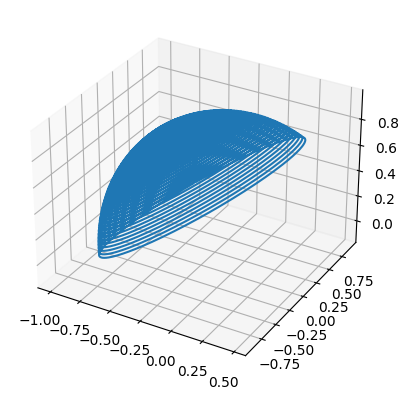

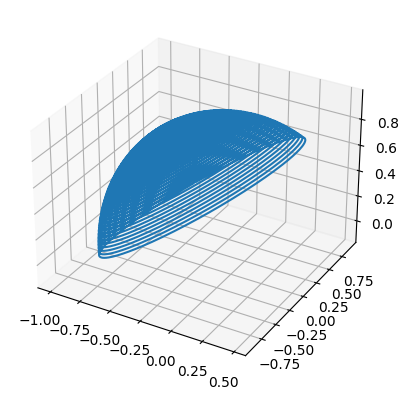

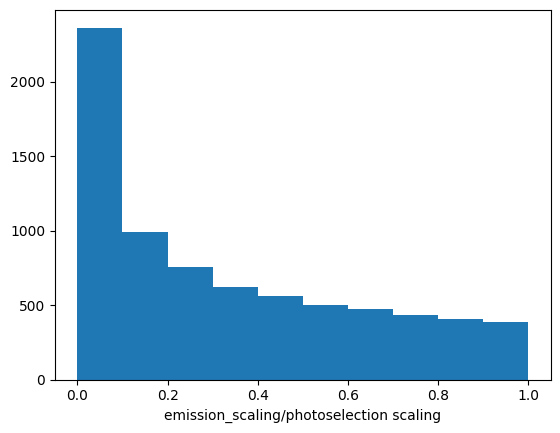

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.4097588960529194
Total energy per dipole per ray: 0.34574165696801673
Energy from Ix 566.9059859404754
Energy from Iy 8.354312950359147e-31
X/Y energy ratio = 6.785788242659793e+32
Half sphere energy 1.397507898300317
Initial energy 0.843768519240068
half sphere energy NA 0.794900347928106
maxr 0.004
1276 escaped out of 5860
Saved checkpoint with 10000 rays
1276 escaped out of 5860
time in trace_rays 62.653997s
ray count 4584
max Ix 4.46345758209711
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034129727863418872
max_r_reduced 0.0034128094937634404 max_r 0.0034129727863418872


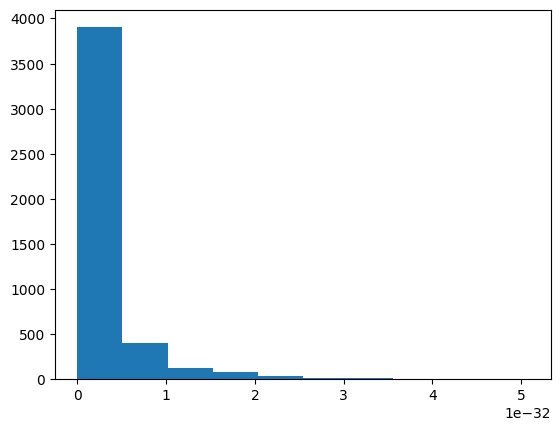

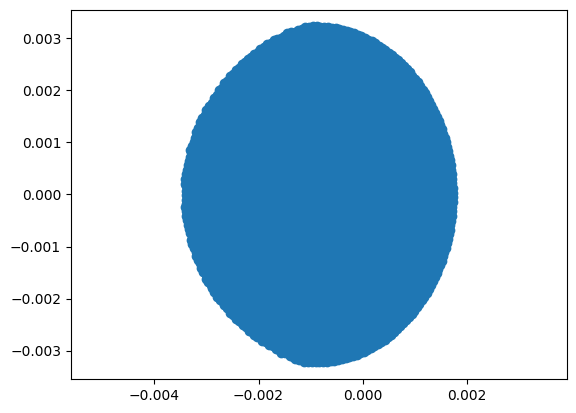

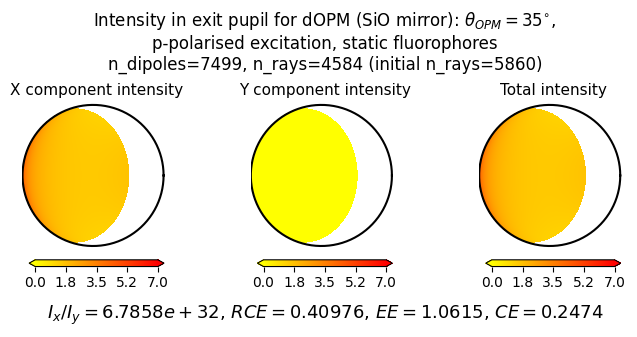

ray count 4584
max Ix 0.7707313751231928
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968373351347638 max_r 0.896864344434275


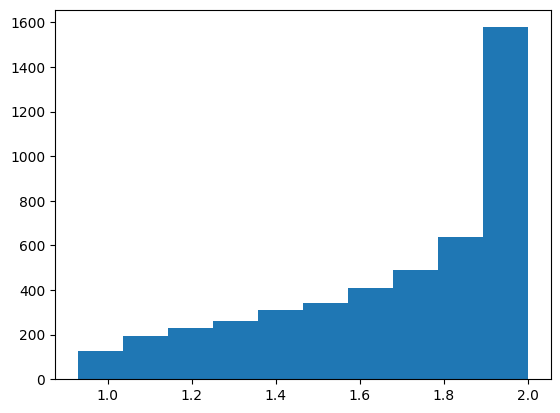

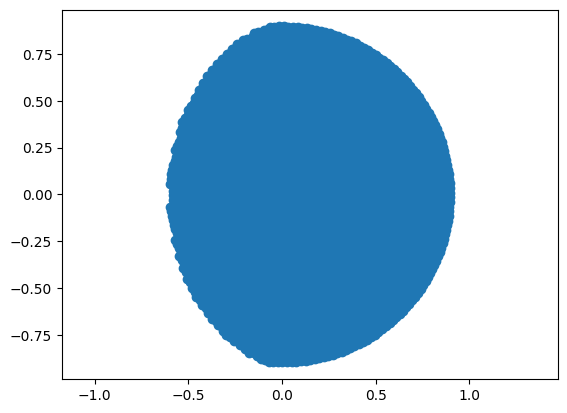

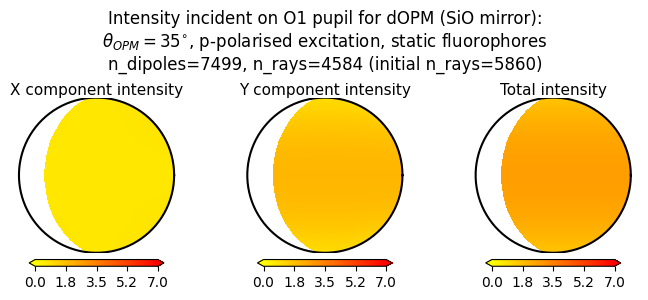

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


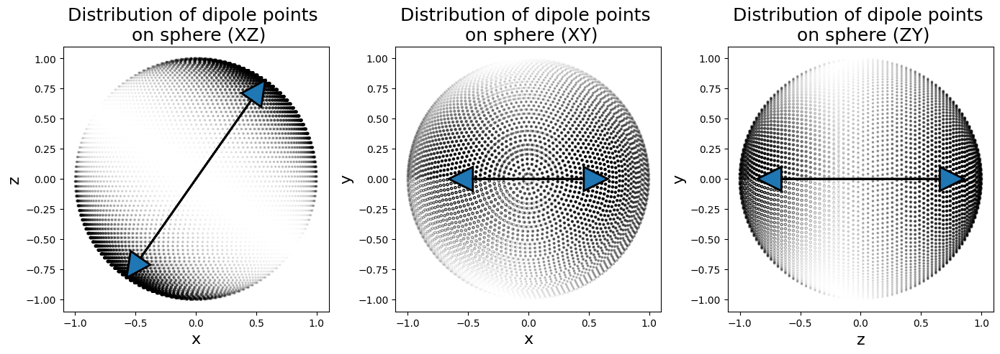

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


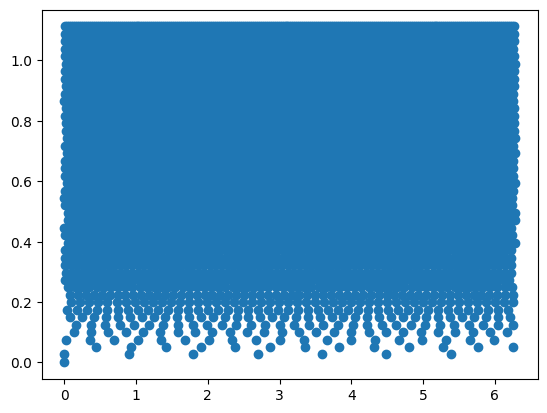

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.3958596987522367
initial_energy 0.7445027791581074
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 34.291040s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMEN

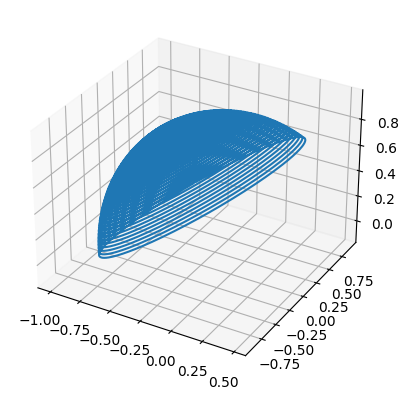

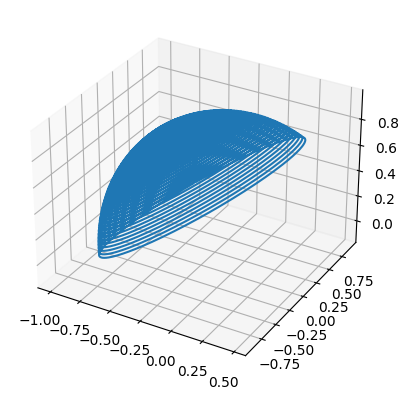

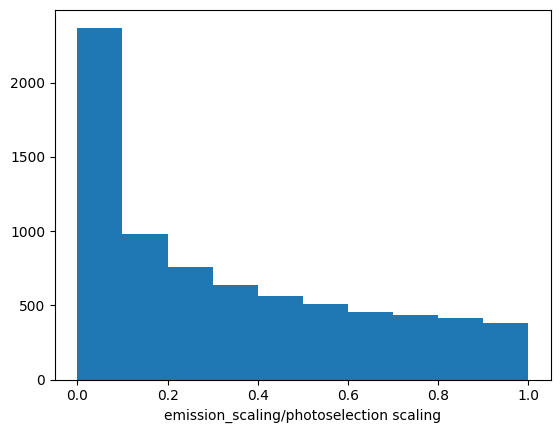

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.28220414398878624
Total energy per dipole per ray: 0.21010176948958603
Energy from Ix 2.284273799810077e-30
Energy from Iy 344.49985525276315
X/Y energy ratio = 6.630695963962253e-33
Half sphere energy 1.3958596987522367
Initial energy 0.7445027791581074
half sphere energy NA 0.7939628545544961
maxr 0.004
1276 escaped out of 5860
Saved checkpoint with 10000 rays
1276 escaped out of 5860
time in trace_rays 66.680208s
ray count 4584
max Ix 2.02379924638455e-31
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034129727863418872
max_r_reduced 0.0034128094937634404 max_r 0.0034129727863418872


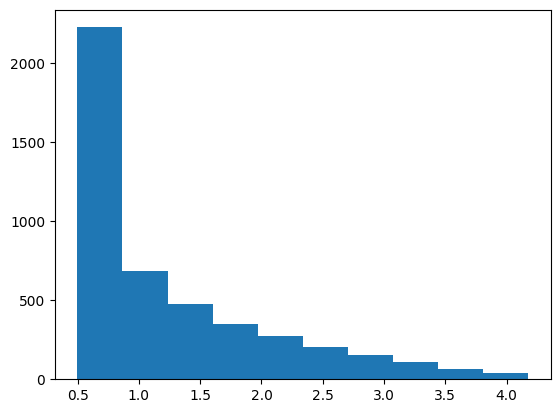

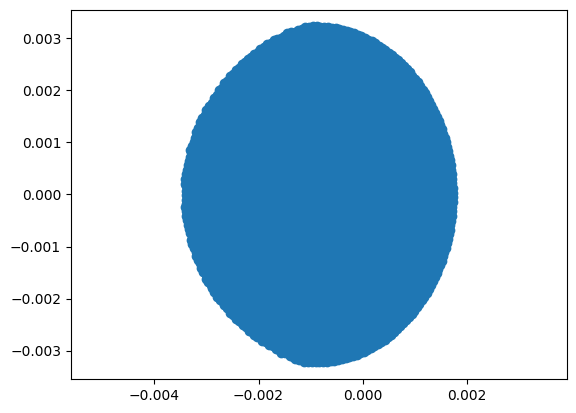

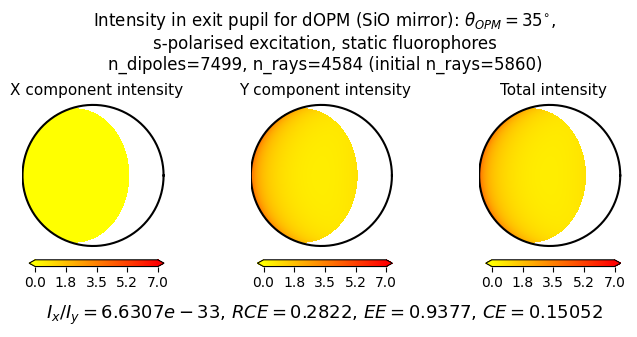

ray count 4584
max Ix 1.8680734855215684
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968373351347638 max_r 0.896864344434275


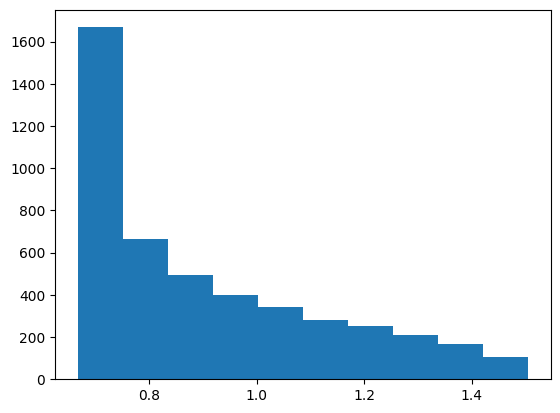

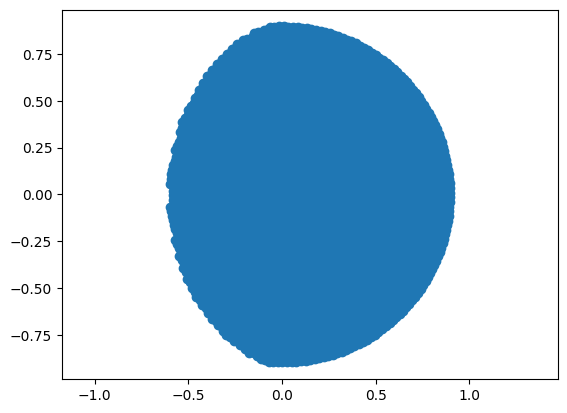

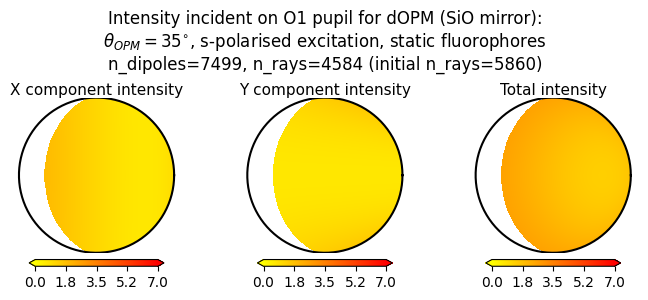

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


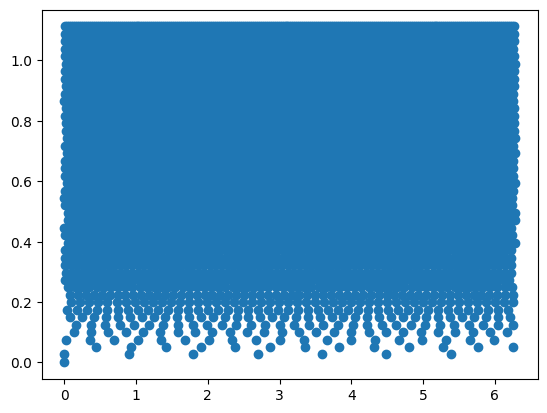

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 4.188790708032343
initial_energy 2.382624774981475
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 31.805275s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

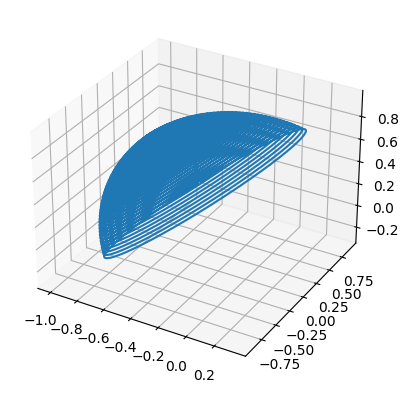

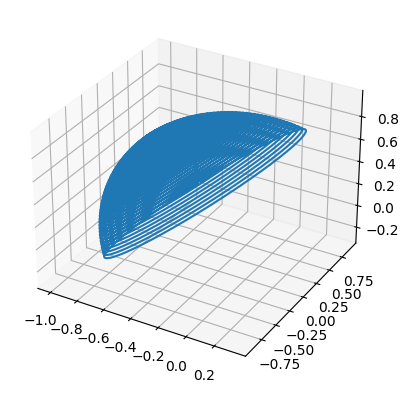

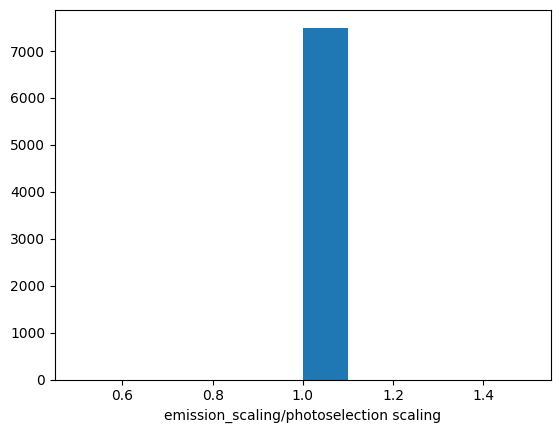

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.2551156368255967
Total energy per dipole per ray: 0.6078448367858429
Energy from Ix 996.671559680708
Energy from Iy 1.4495205200298796e-30
X/Y energy ratio = 6.875870647627418e+32
Half sphere energy 4.188790708032343
Initial energy 2.382624774981475
half sphere energy NA 2.3825777265821206
maxr 0.004
1797 escaped out of 5860
Saved checkpoint with 10000 rays
1797 escaped out of 5860
time in trace_rays 61.640313s
ray count 4063
max Ix 7.680504197229963
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034111373998256
max_r_reduced 0.00341037895989145 max_r 0.0034111373998256


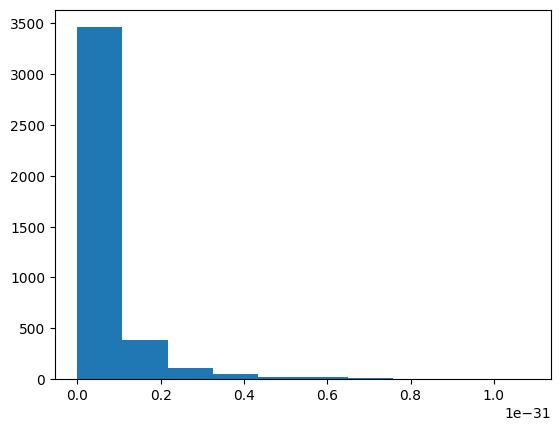

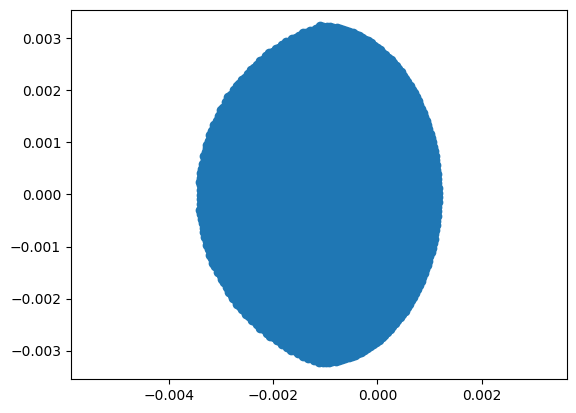

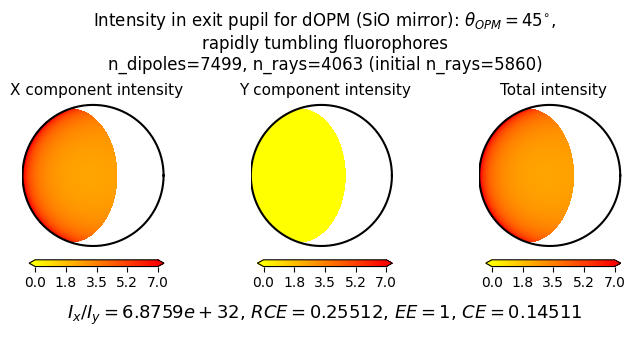

ray count 4063
max Ix 3.333547387795266
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.896770147912909 max_r 0.896864344434275


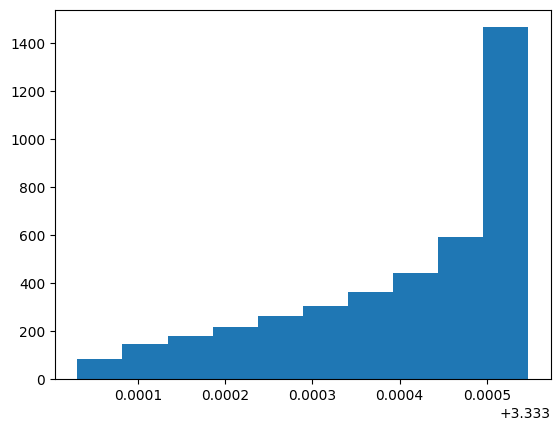

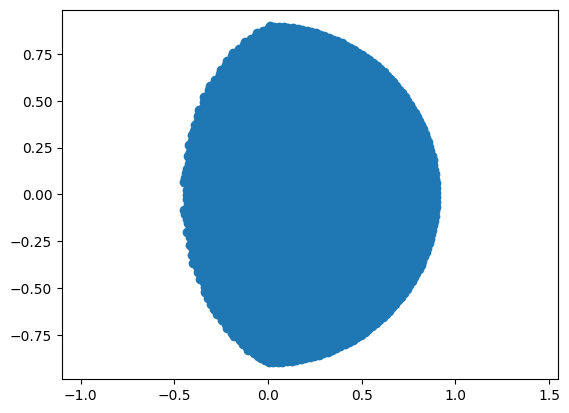

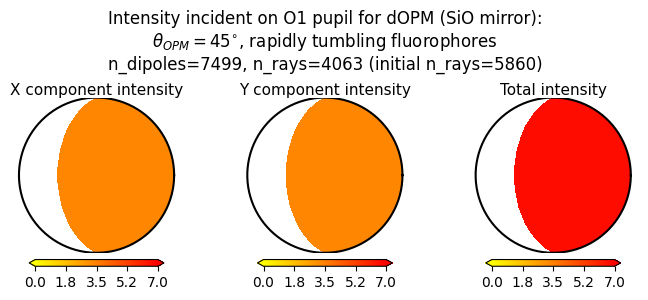

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


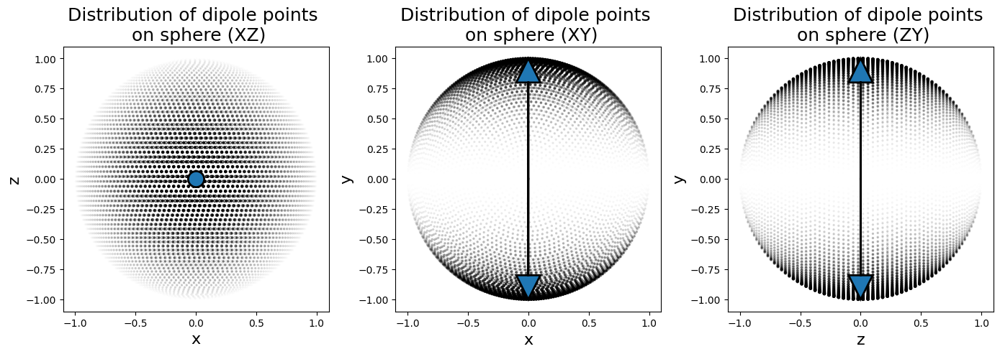

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


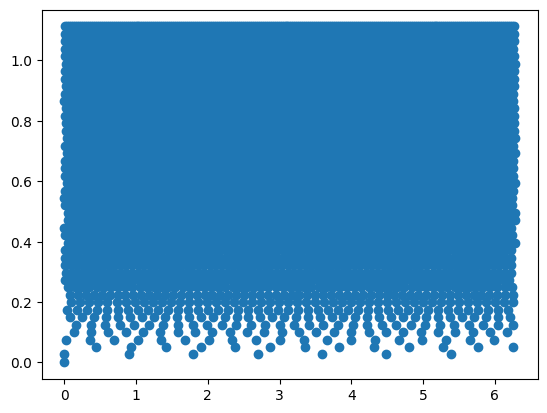

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.397507898300317
initial_energy 0.843768519240068
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 34.415892s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

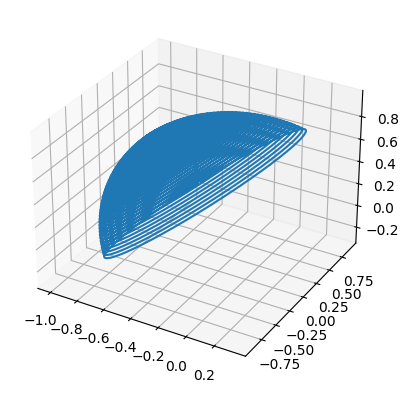

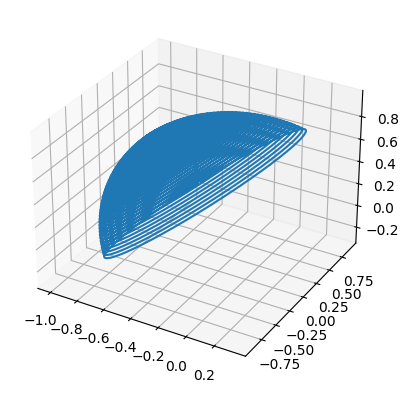

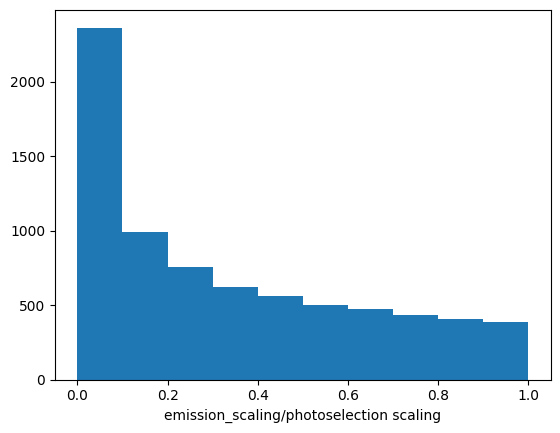

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.36643161450961753
Total energy per dipole per ray: 0.3091834607775274
Energy from Ix 506.9622104714641
Energy from Iy 7.363616035524773e-31
X/Y energy ratio = 6.88469099998823e+32
Half sphere energy 1.397507898300317
Initial energy 0.843768519240068
half sphere energy NA 0.794900347928106
maxr 0.004
1797 escaped out of 5860
Saved checkpoint with 10000 rays
1797 escaped out of 5860
time in trace_rays 61.355296s
ray count 4063
max Ix 4.596433556566324
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034111373998256
max_r_reduced 0.00341037895989145 max_r 0.0034111373998256


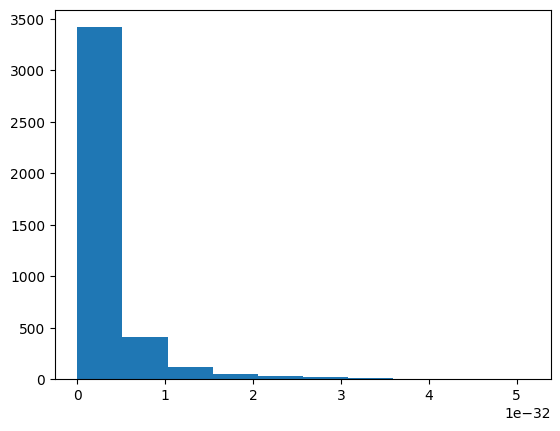

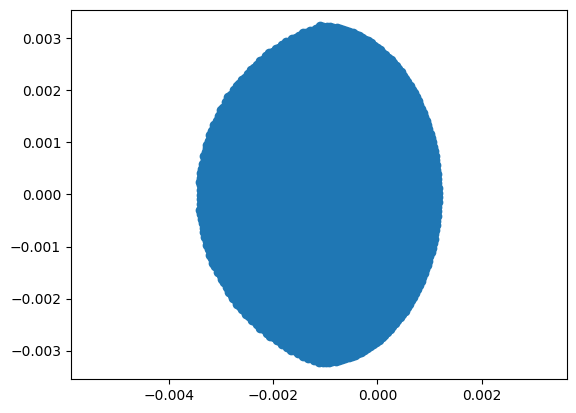

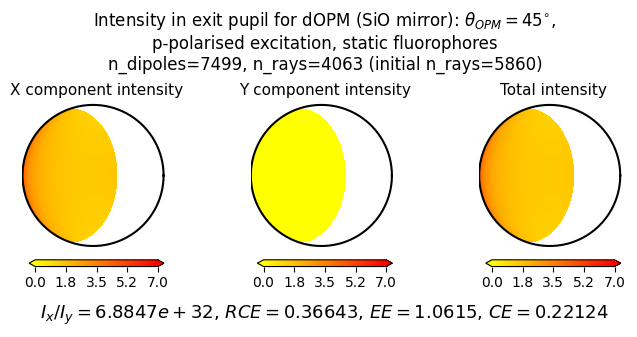

ray count 4063
max Ix 0.7707313751231928
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.896770147912909 max_r 0.896864344434275


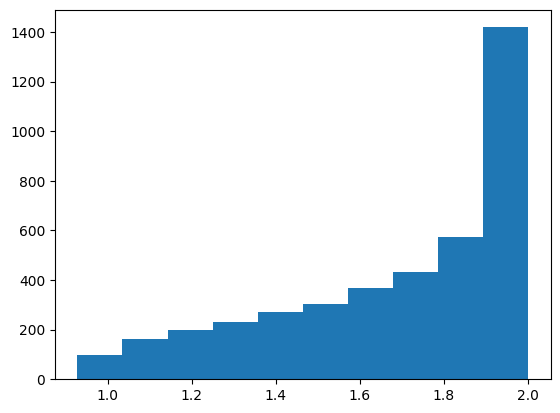

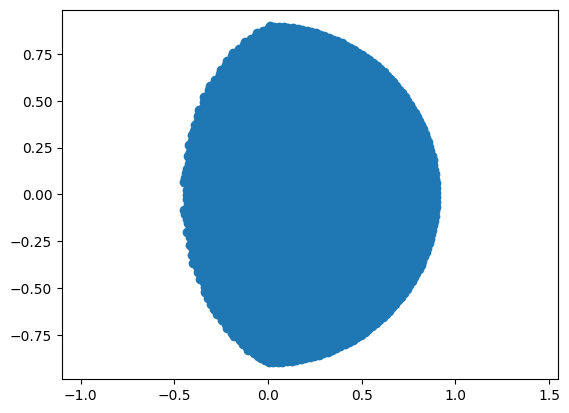

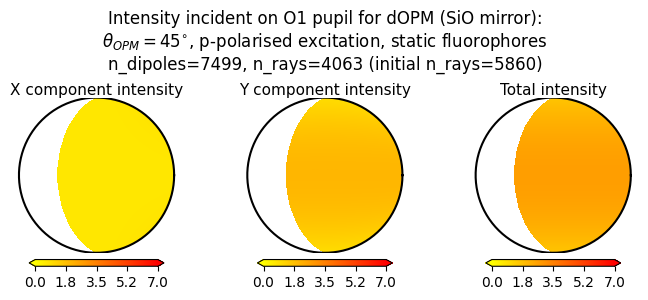

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


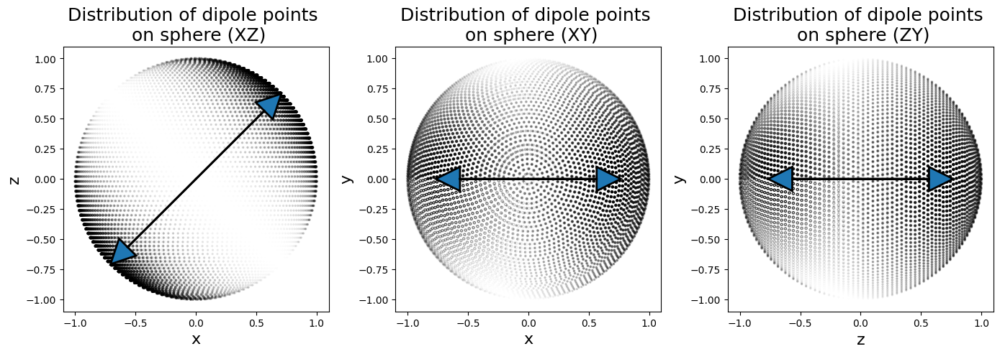

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


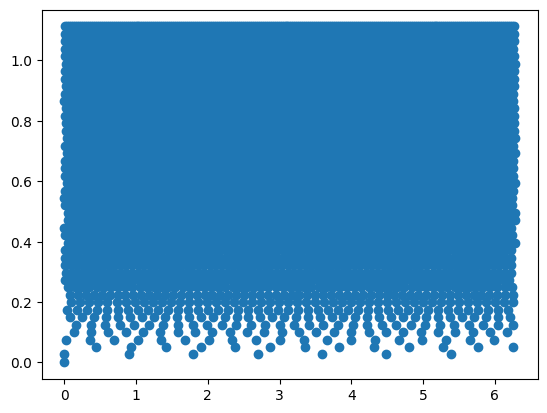

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.396216507121376
initial_energy 0.7697612404159438
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 33.544100s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT

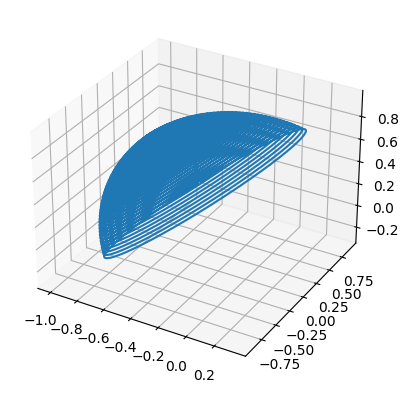

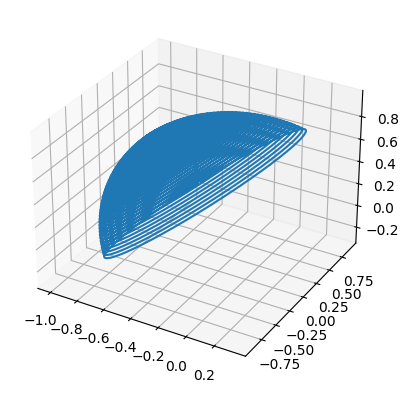

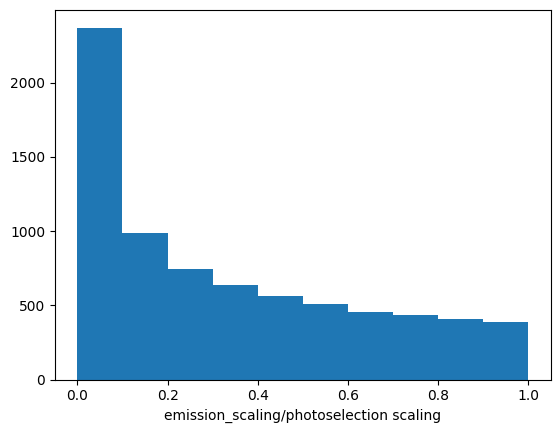

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.2562021026100075
Total energy per dipole per ray: 0.1972144483022523
Energy from Ix 2.236117640294085e-30
Energy from Iy 323.36876104818816
X/Y energy ratio = 6.915070067516078e-33
Half sphere energy 1.396216507121376
Initial energy 0.7697612404159438
half sphere energy NA 0.794165806607302
maxr 0.004
1797 escaped out of 5860
Saved checkpoint with 10000 rays
1797 escaped out of 5860
time in trace_rays 61.167969s
ray count 4063
max Ix 2.1317993336940094e-31
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034111373998256
max_r_reduced 0.00341037895989145 max_r 0.0034111373998256


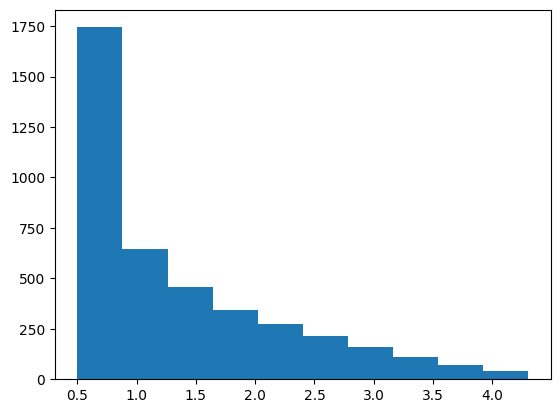

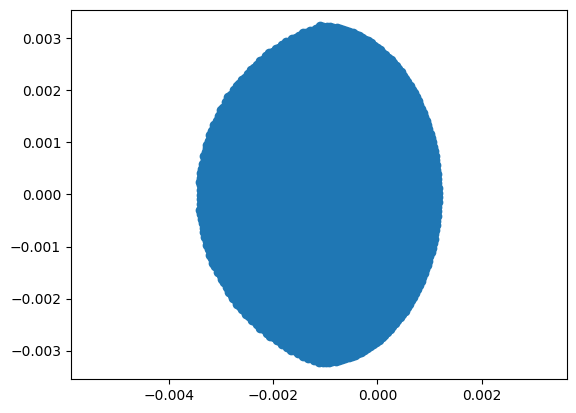

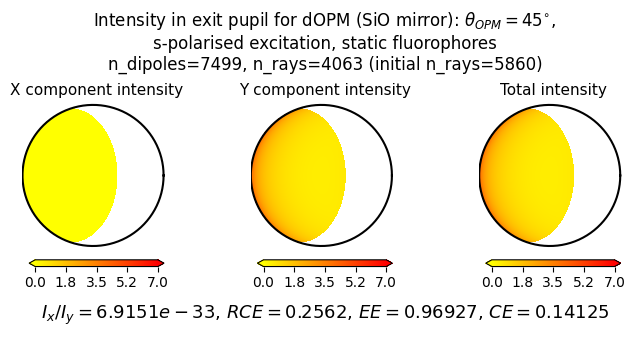

ray count 4063
max Ix 1.8682325055489513
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.896770147912909 max_r 0.896864344434275


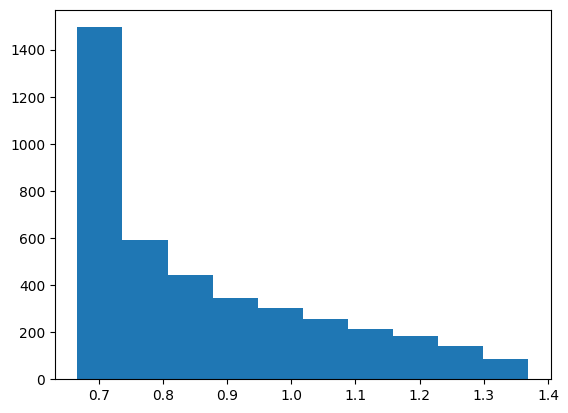

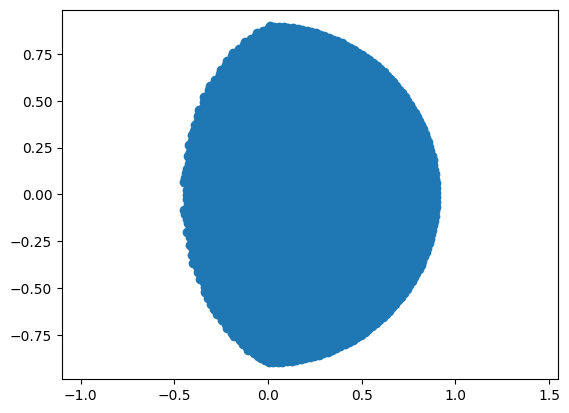

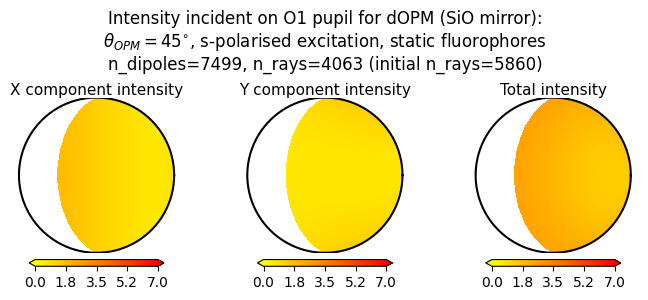

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


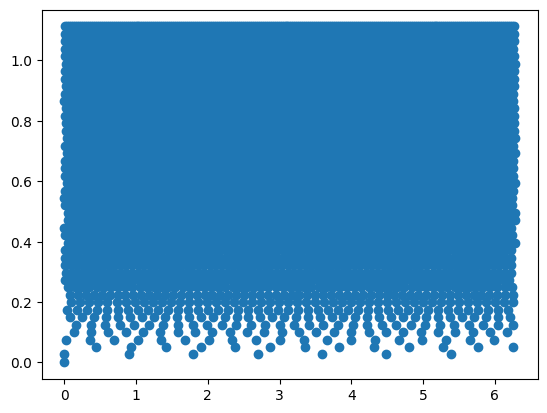

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 4.188790708032343
initial_energy 2.382624774981475
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 35.230114s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

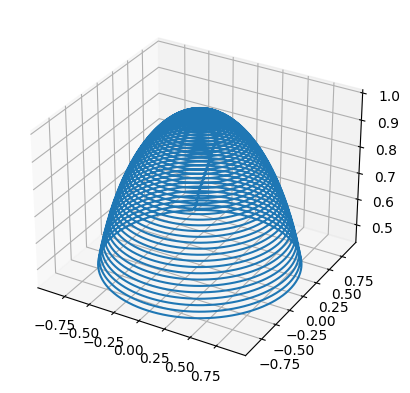

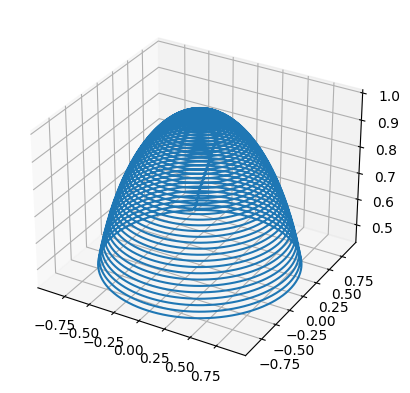

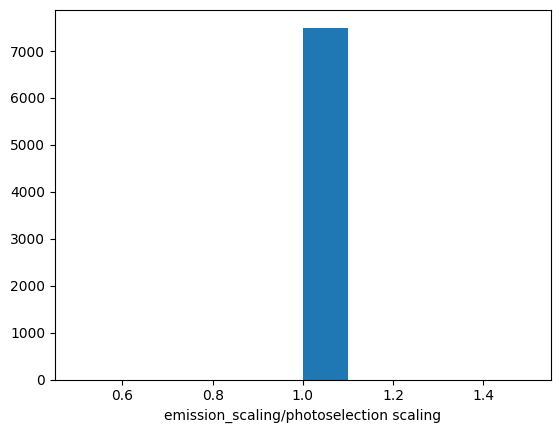

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.5000000000000001
Total energy per dipole per ray: 1.1913123874907376
Energy from Ix 1953.3721493560538
Energy from Iy 2.6399697718809818e-30
X/Y energy ratio = 7.39922165080047e+32
Half sphere energy 4.188790708032343
Initial energy 2.382624774981475
half sphere energy NA 2.3825777265821206
maxr 0.004
0 escaped out of 5860
Saved checkpoint with 10000 rays
0 escaped out of 5860
time in trace_rays 68.082705s
ray count 5860
max Ix 7.536907875204065
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.003228711639216003
max_r_reduced 0.0032286714653977605 max_r 0.003228711639216003


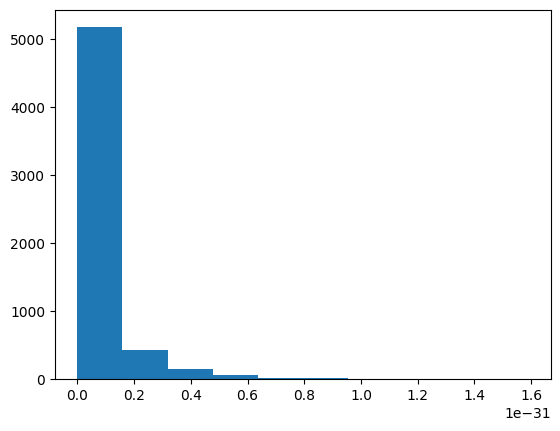

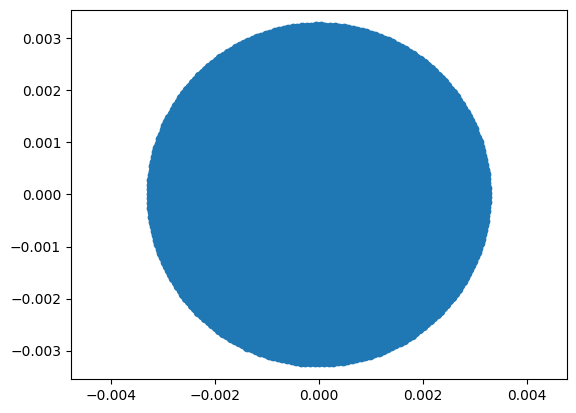

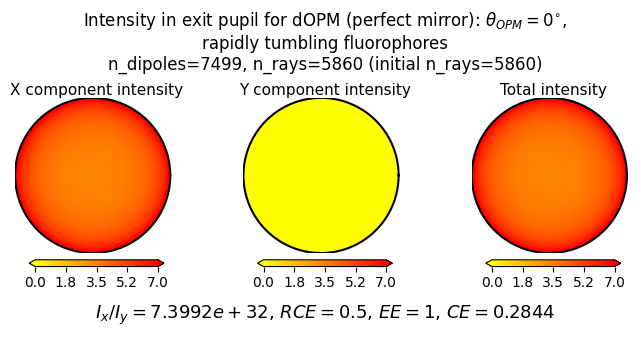

ray count 5860
max Ix 3.333547387795266
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968531850403161 max_r 0.896864344434275


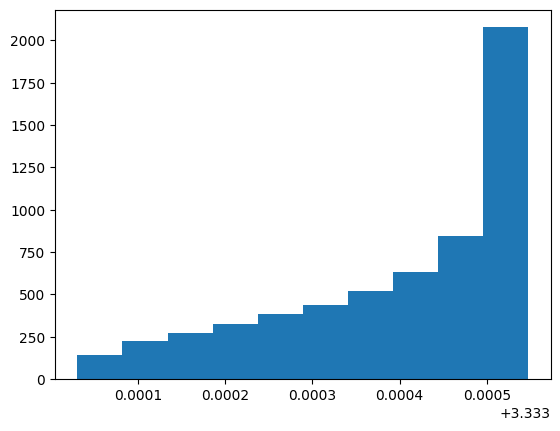

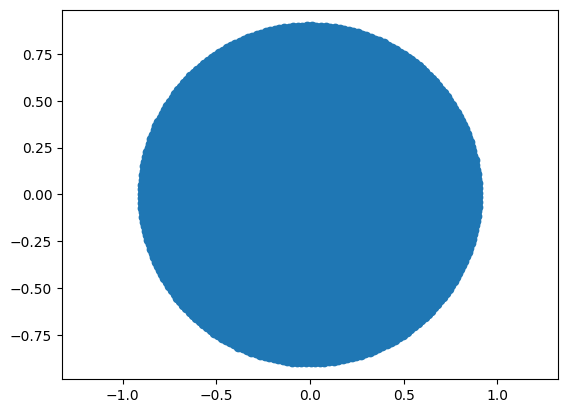

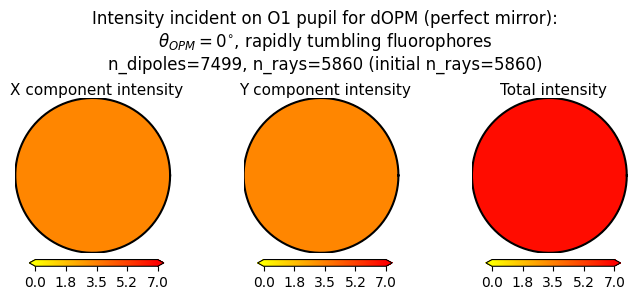

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


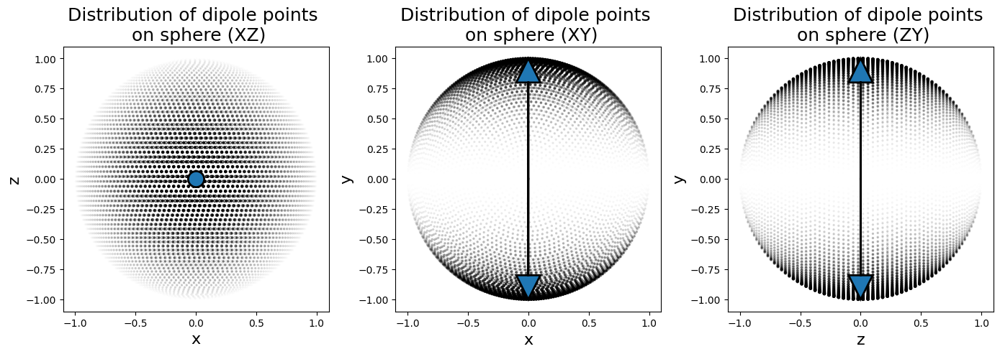

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


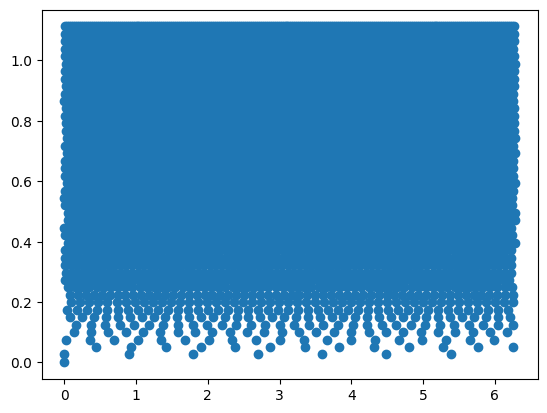

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.397507898300317
initial_energy 0.843768519240068
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 34.184384s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

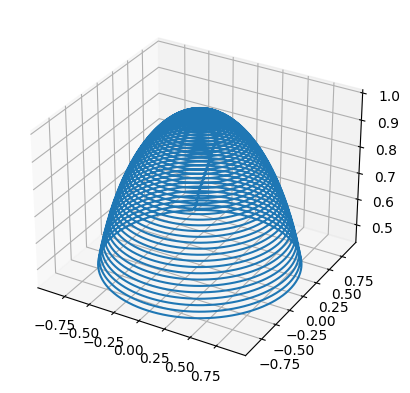

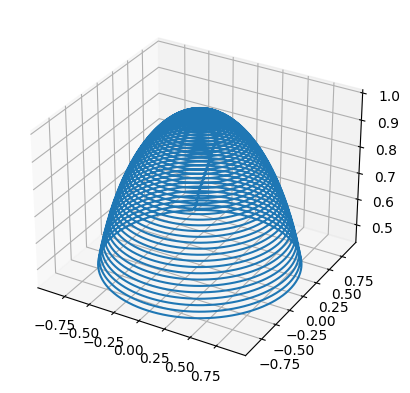

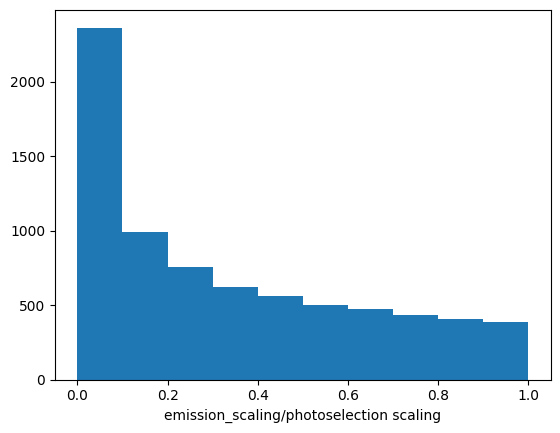

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.7098865781385973
Total energy per dipole per ray: 0.5989799468644031
Energy from Ix 982.1359691324378
Energy from Iy 1.2960585073823282e-30
X/Y energy ratio = 7.577867538681373e+32
Half sphere energy 1.397507898300317
Initial energy 0.843768519240068
half sphere energy NA 0.794900347928106
maxr 0.004
0 escaped out of 5860
Saved checkpoint with 10000 rays
0 escaped out of 5860
time in trace_rays 67.384561s
ray count 5860
max Ix 4.524079057329115
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.003228711639216003
max_r_reduced 0.0032286714653977605 max_r 0.003228711639216003


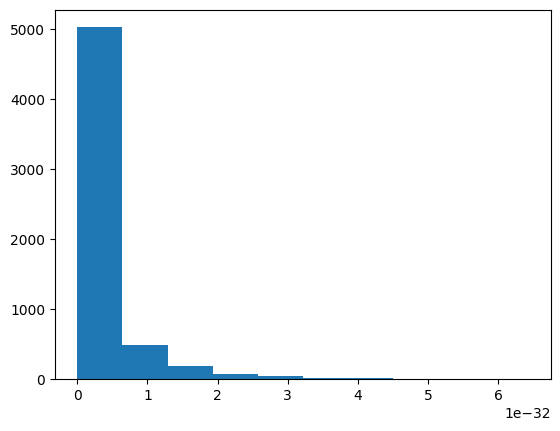

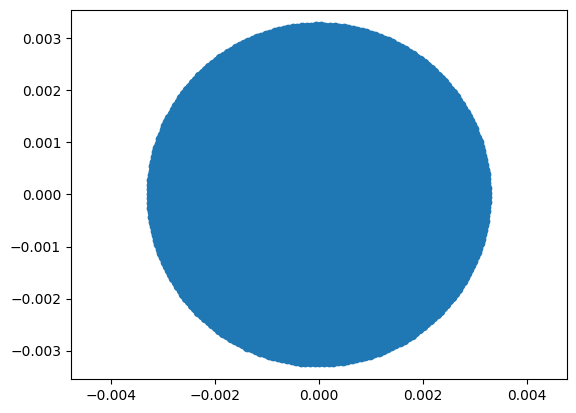

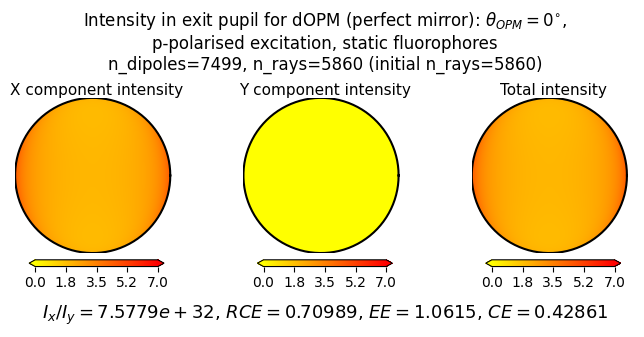

ray count 5860
max Ix 0.7707313751231928
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968531850403161 max_r 0.896864344434275


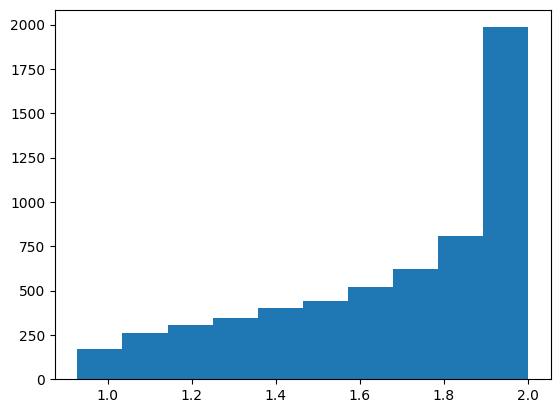

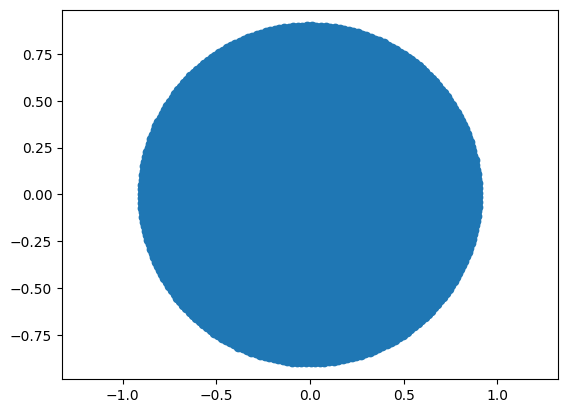

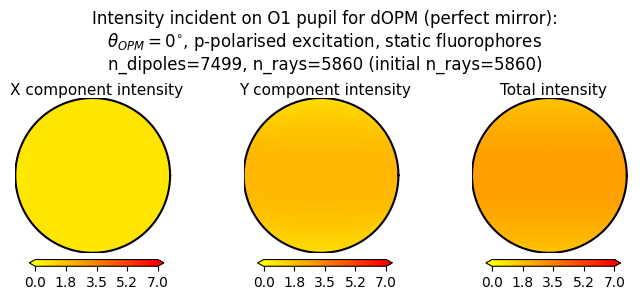

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


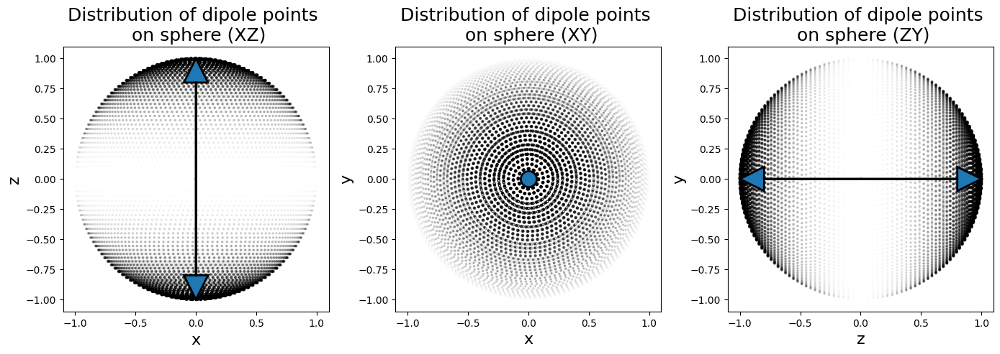

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


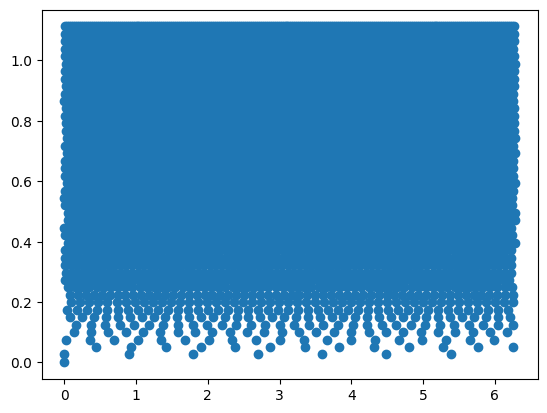

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.394998811439359
initial_energy 0.6958266863837751
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 34.183556s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT

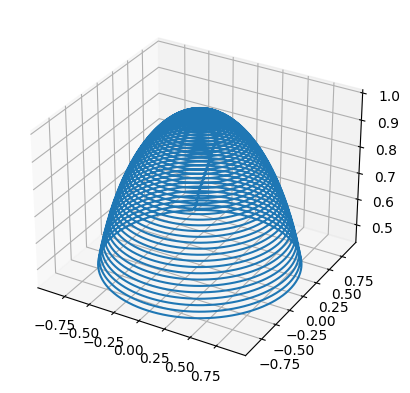

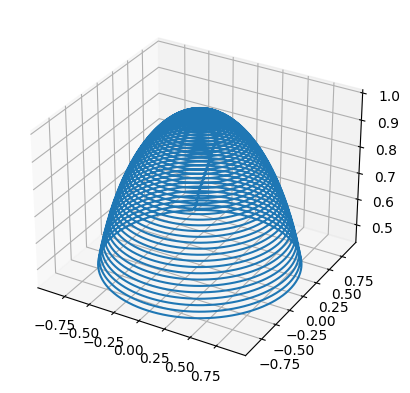

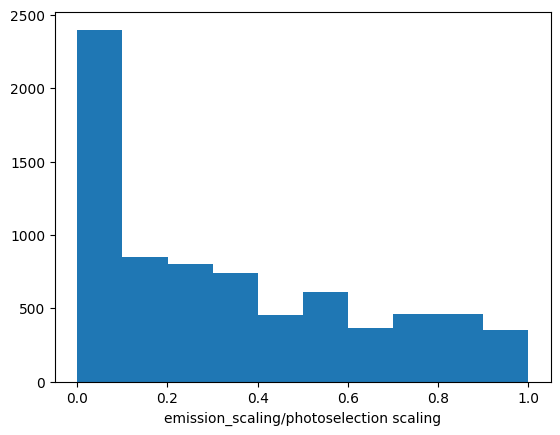

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.5000000000000001
Total energy per dipole per ray: 0.3479133431918876
Energy from Ix 3.757179713771271e-30
Energy from Iy 570.4668583291061
X/Y energy ratio = 6.586148974150798e-33
Half sphere energy 1.394998811439359
Initial energy 0.6958266863837751
half sphere energy NA 0.7934731831720547
maxr 0.004
0 escaped out of 5860
Saved checkpoint with 10000 rays
0 escaped out of 5860
time in trace_rays 68.729882s
ray count 5860
max Ix 1.4803257902424714e-31
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.003228711639216003
max_r_reduced 0.0032286714653977605 max_r 0.003228711639216003


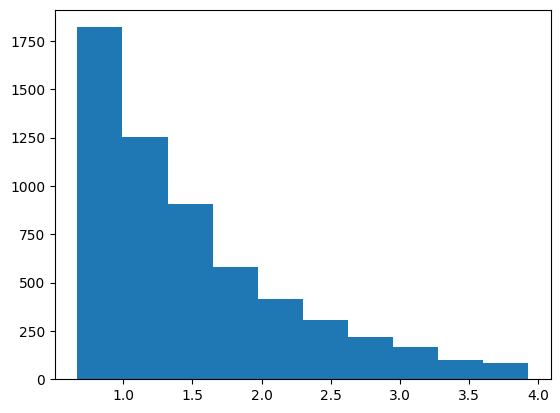

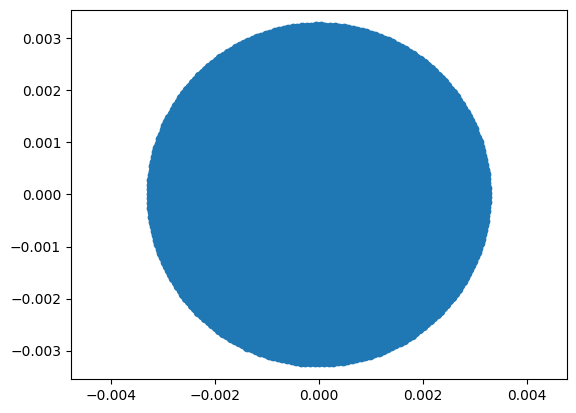

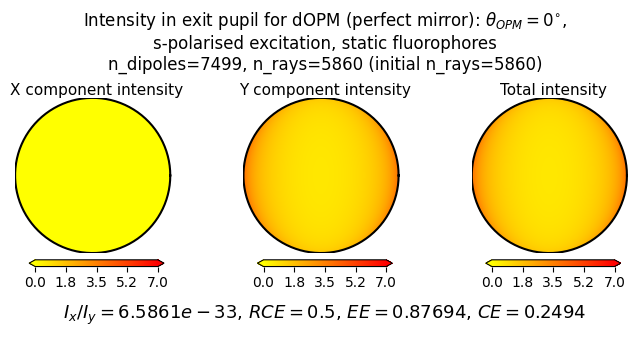

ray count 5860
max Ix 1.7387453587440955
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968531850403161 max_r 0.896864344434275


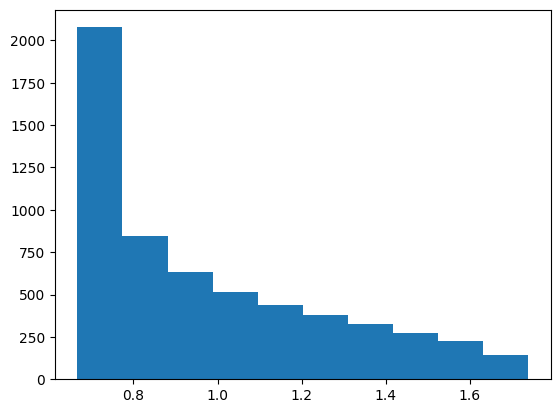

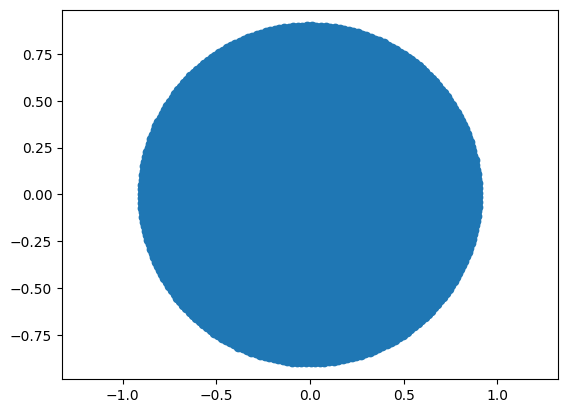

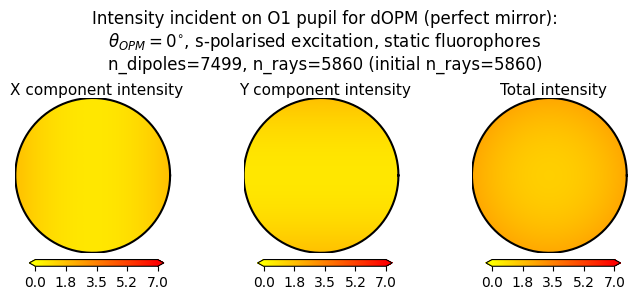

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


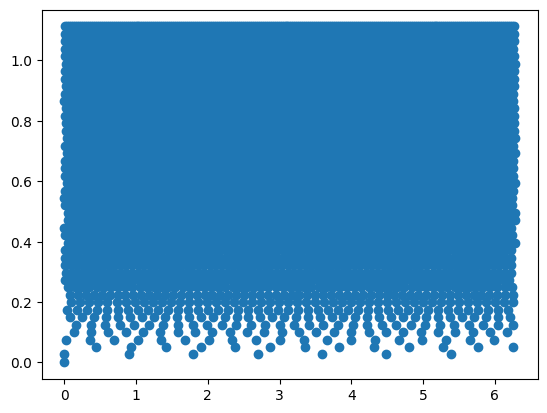

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 4.188790708032343
initial_energy 2.382624774981475
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 31.304008s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

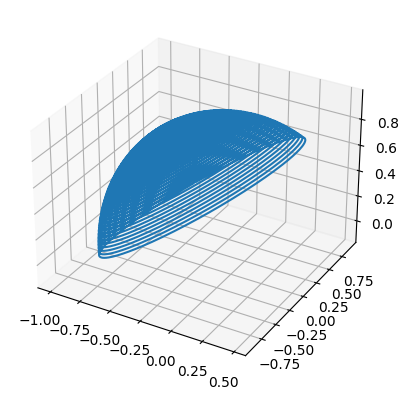

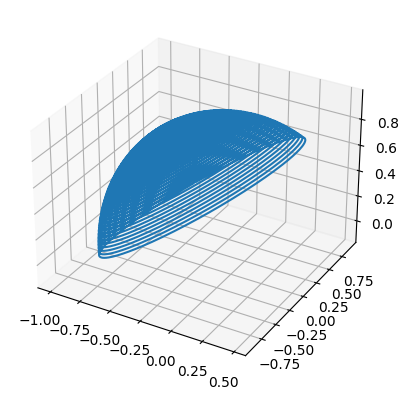

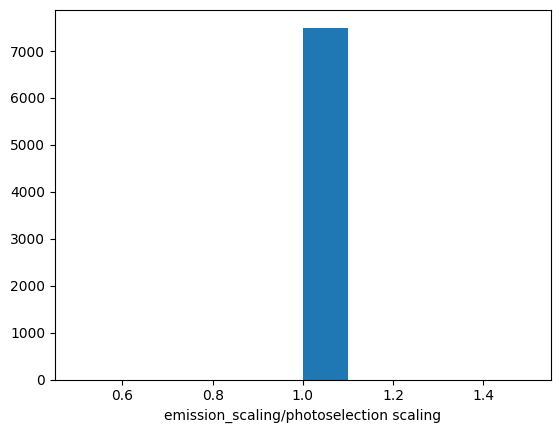

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.3911263599639061
Total energy per dipole per ray: 0.9319073553983251
Energy from Ix 1528.0306768650094
Energy from Iy 2.0720328492228064e-30
X/Y energy ratio = 7.374548513736906e+32
Half sphere energy 4.188790708032343
Initial energy 2.382624774981475
half sphere energy NA 2.3825777265821206
maxr 0.004
1276 escaped out of 5860
Saved checkpoint with 10000 rays
1276 escaped out of 5860
time in trace_rays 63.114667s
ray count 4584
max Ix 10.672849127448195
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034129727863418872
max_r_reduced 0.0034128094937634404 max_r 0.0034129727863418872


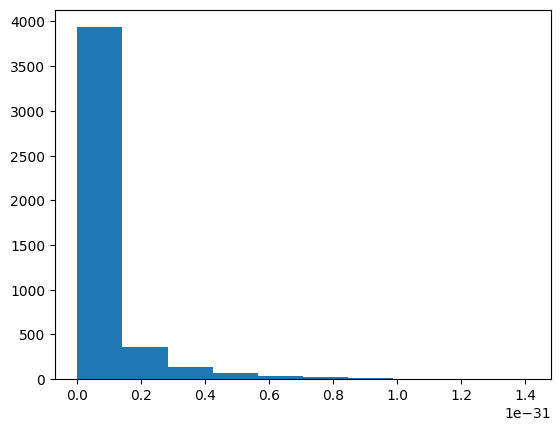

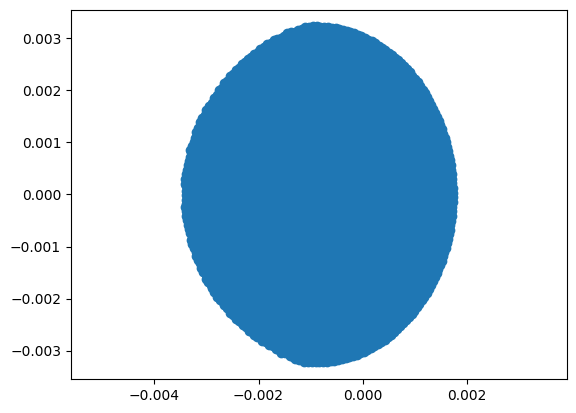

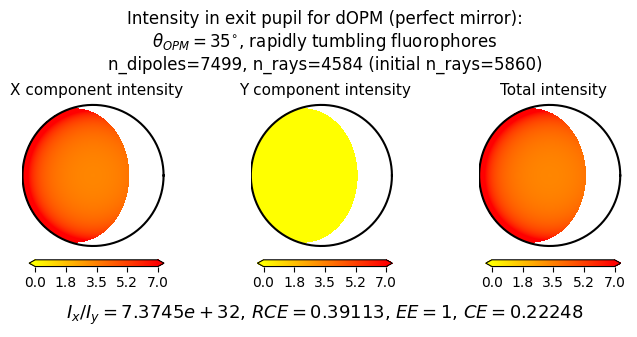

ray count 4584
max Ix 3.333547387795266
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968373351347638 max_r 0.896864344434275


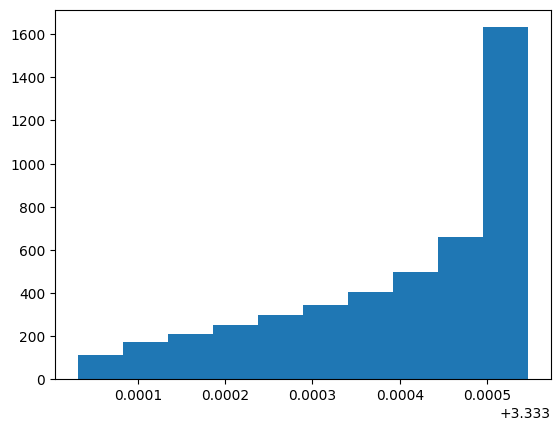

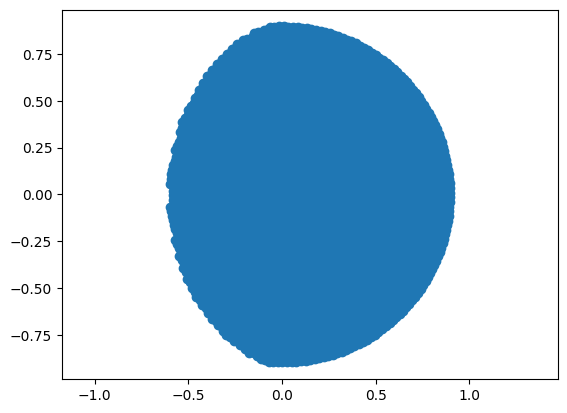

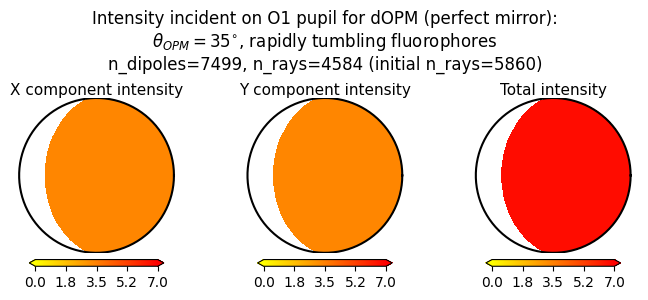

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


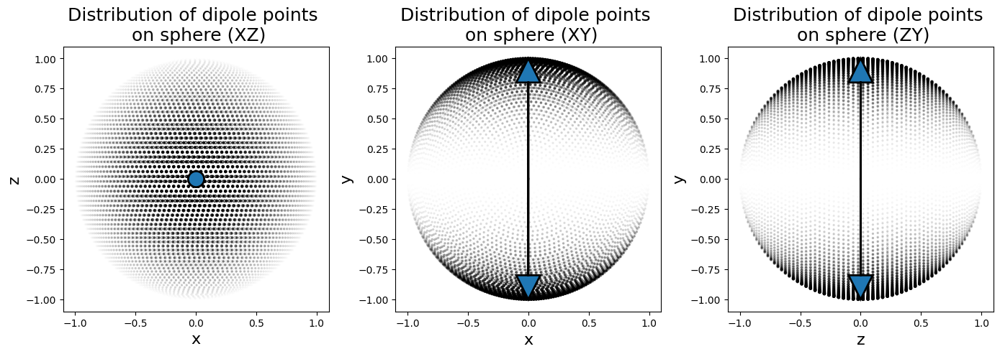

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


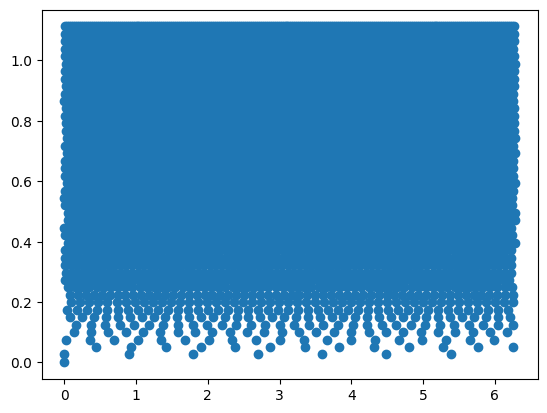

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.397507898300317
initial_energy 0.843768519240068
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 34.423856s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

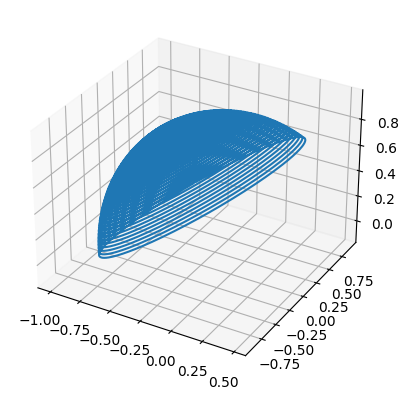

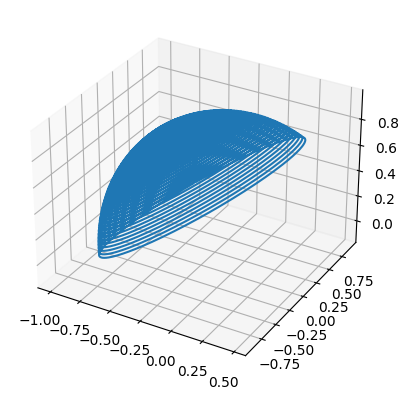

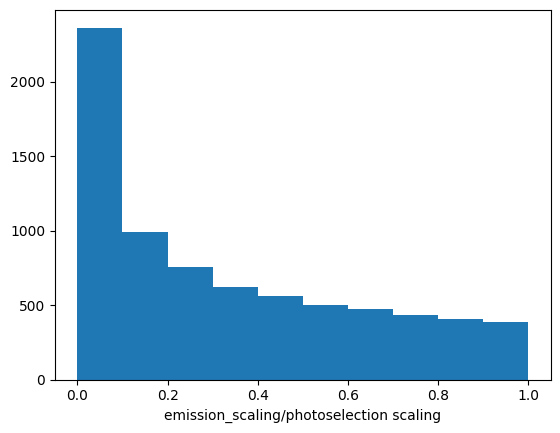

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.5572906844821197
Total energy per dipole per ray: 0.4702243356317621
Energy from Ix 771.0178546092545
Energy from Iy 1.038280926290823e-30
X/Y energy ratio = 7.425907912646101e+32
Half sphere energy 1.397507898300317
Initial energy 0.843768519240068
half sphere energy NA 0.794900347928106
maxr 0.004
1276 escaped out of 5860
Saved checkpoint with 10000 rays
1276 escaped out of 5860
time in trace_rays 62.932450s
ray count 4584
max Ix 6.381887775724642
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034129727863418872
max_r_reduced 0.0034128094937634404 max_r 0.0034129727863418872


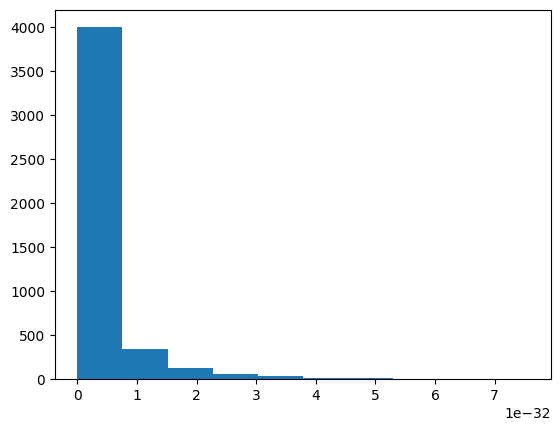

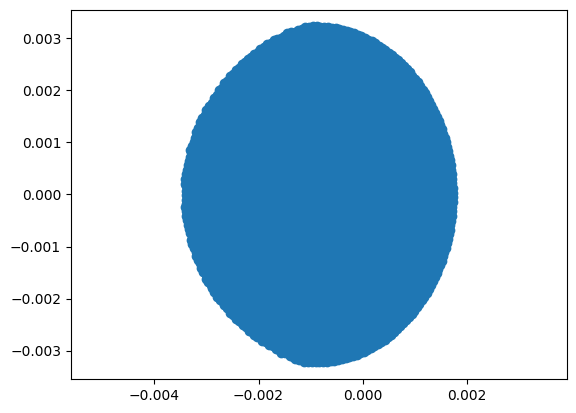

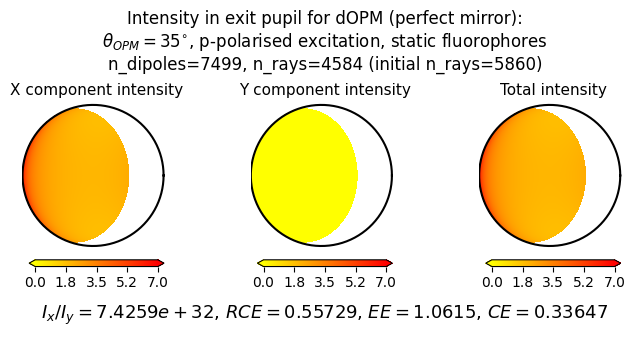

ray count 4584
max Ix 0.7707313751231928
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968373351347638 max_r 0.896864344434275


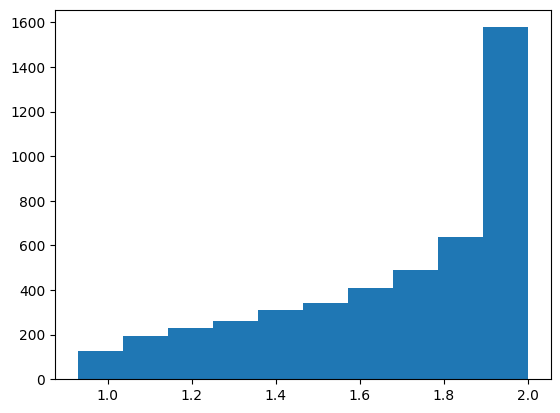

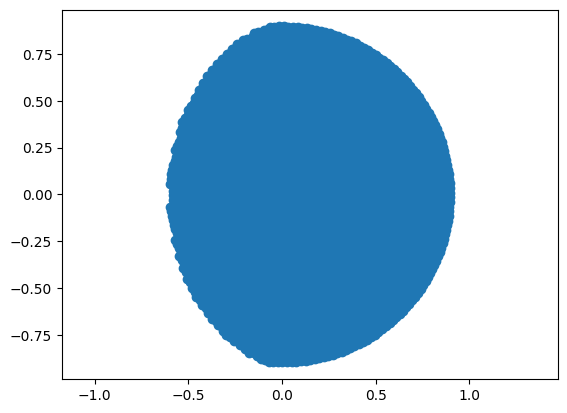

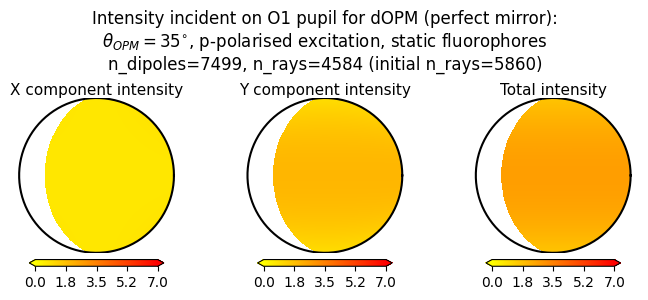

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


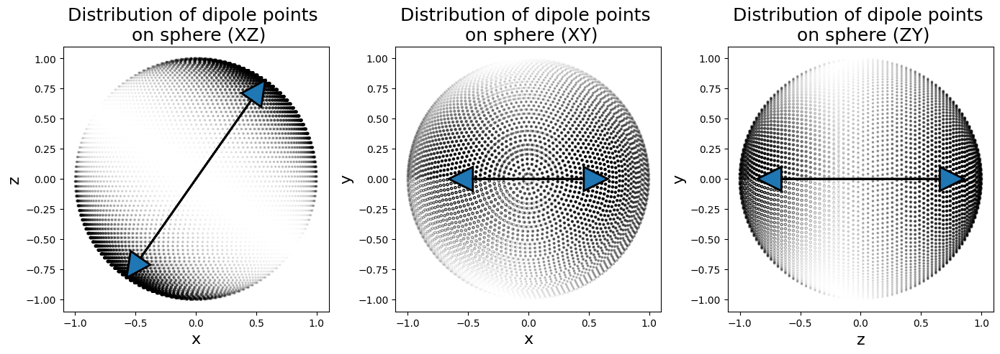

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


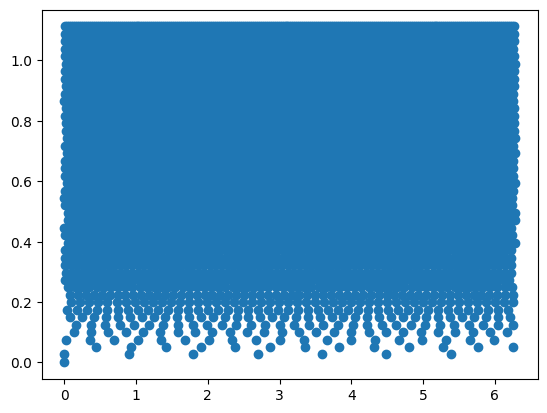

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.3958596987522367
initial_energy 0.7445027791581074
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 33.751629s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMEN

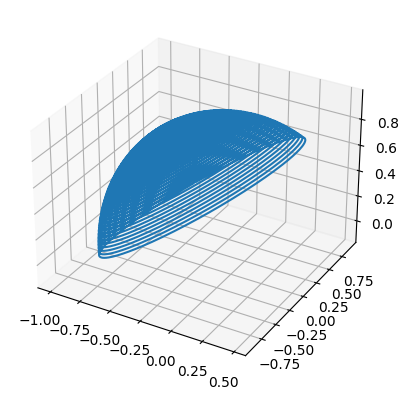

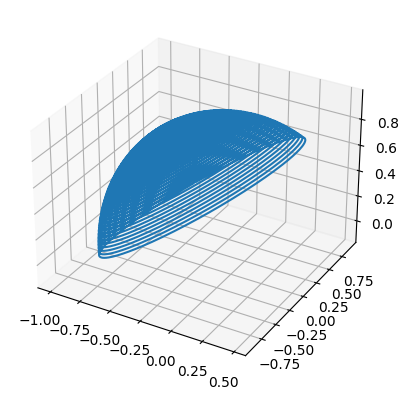

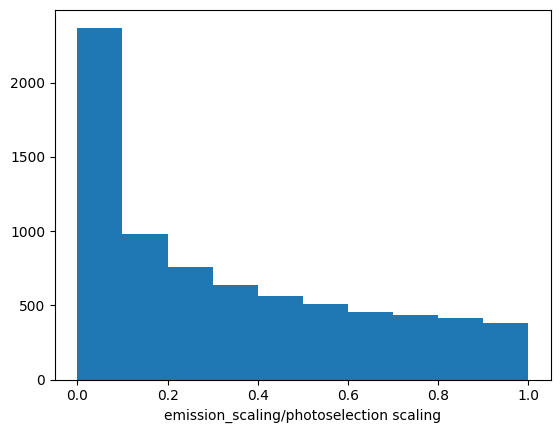

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.386877737044963
Total energy per dipole per ray: 0.2880315504243744
Energy from Ix 3.144814833822185e-30
Energy from Iy 472.279827392621
X/Y energy ratio = 6.658795594095536e-33
Half sphere energy 1.3958596987522367
Initial energy 0.7445027791581074
half sphere energy NA 0.7939628545544961
maxr 0.004
1276 escaped out of 5860
Saved checkpoint with 10000 rays
1276 escaped out of 5860
time in trace_rays 62.703175s
ray count 4584
max Ix 3.113671078690903e-31
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034129727863418872
max_r_reduced 0.0034128094937634404 max_r 0.0034129727863418872


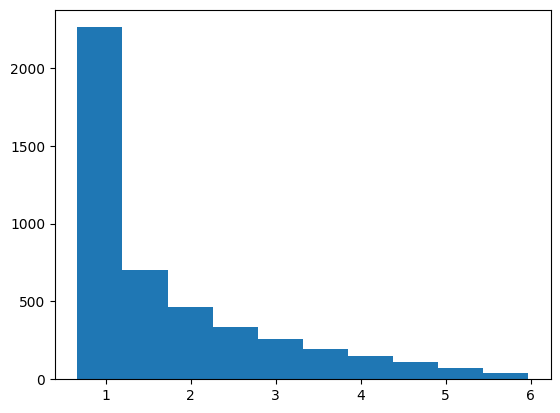

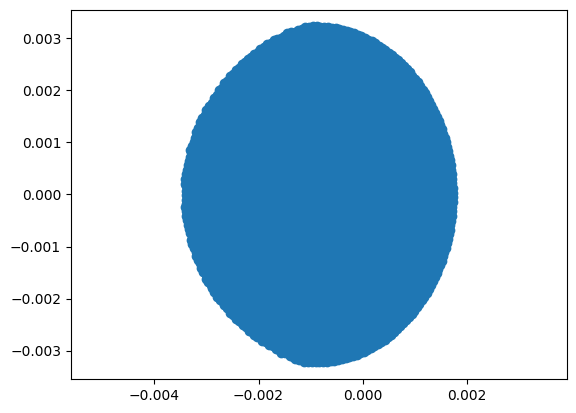

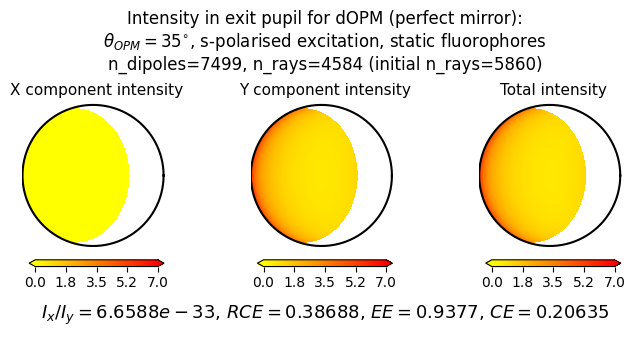

ray count 4584
max Ix 1.8680734855215684
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.8968373351347638 max_r 0.896864344434275


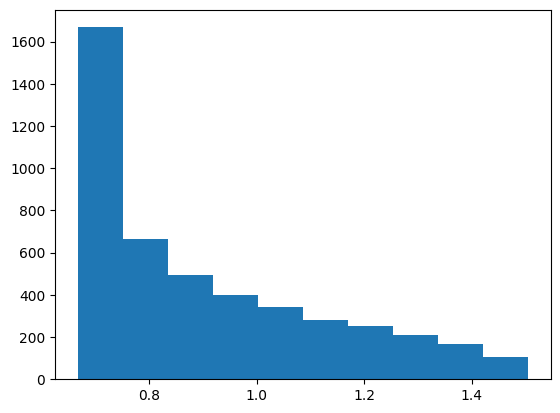

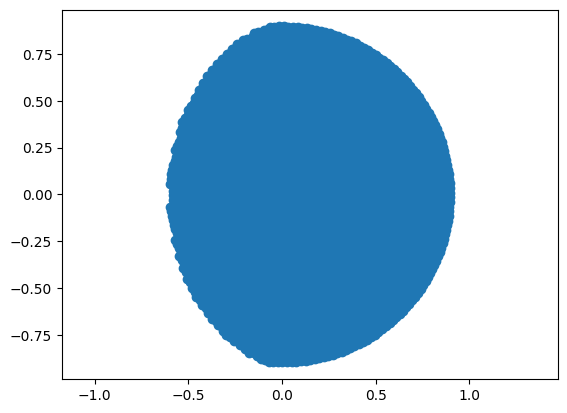

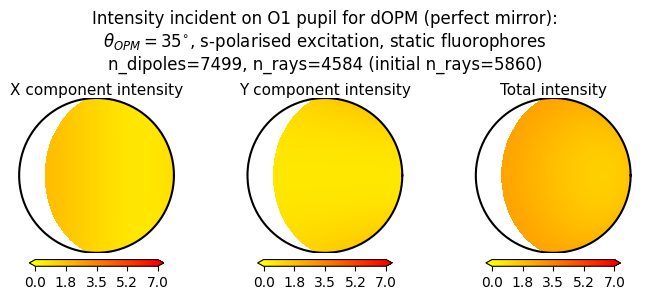

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


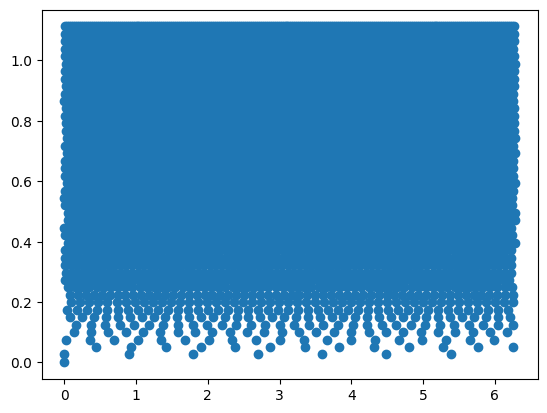

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 4.188790708032343
initial_energy 2.382624774981475
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 33.311275s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

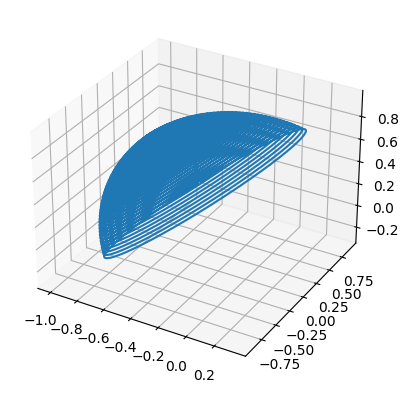

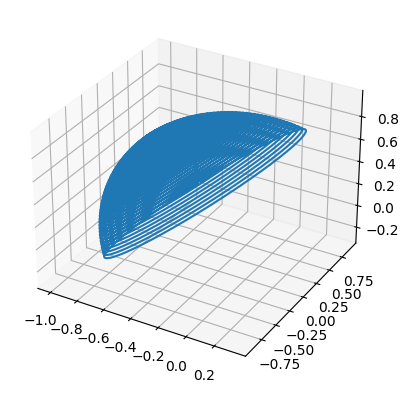

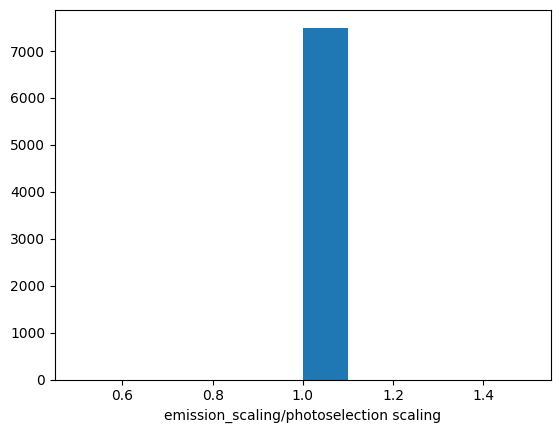

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.34667278167811993
Total energy per dipole per ray: 0.8259911584380325
Energy from Ix 1354.361913339662
Energy from Iy 1.8603625188892225e-30
X/Y energy ratio = 7.280096753122712e+32
Half sphere energy 4.188790708032343
Initial energy 2.382624774981475
half sphere energy NA 2.3825777265821206
maxr 0.004
1797 escaped out of 5860
Saved checkpoint with 10000 rays
1797 escaped out of 5860
time in trace_rays 61.487088s
ray count 4063
max Ix 10.654453774170776
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034111373998256
max_r_reduced 0.00341037895989145 max_r 0.0034111373998256


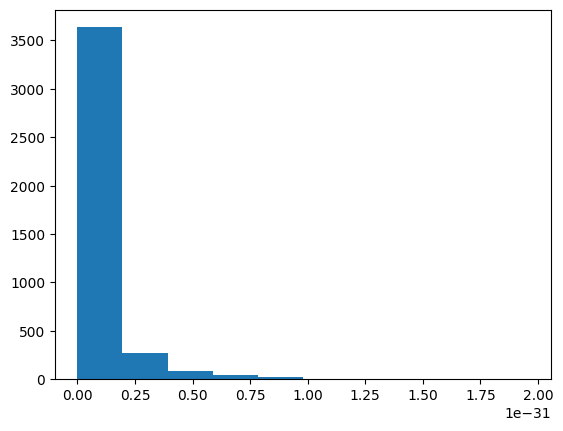

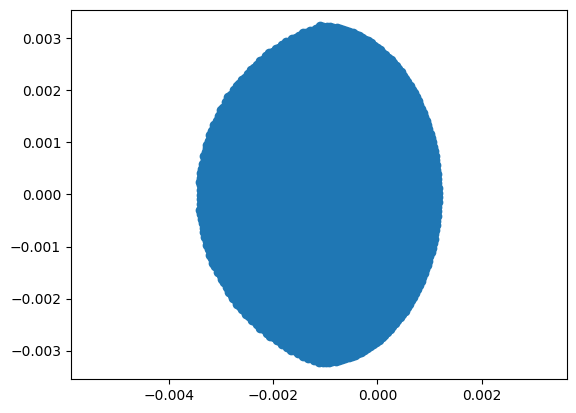

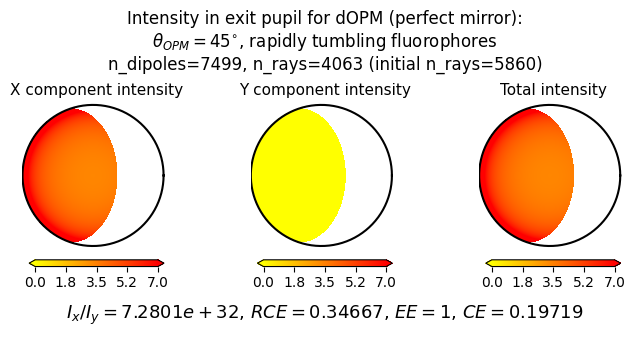

ray count 4063
max Ix 3.333547387795266
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.896770147912909 max_r 0.896864344434275


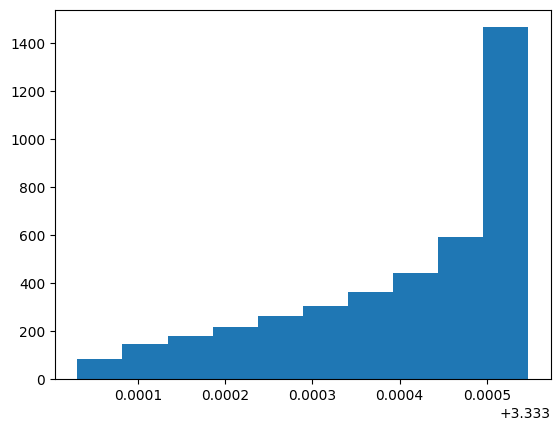

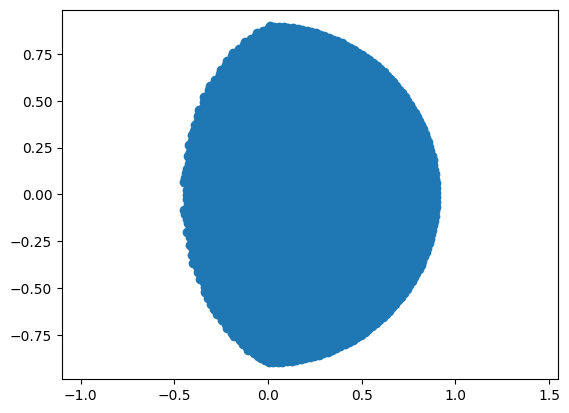

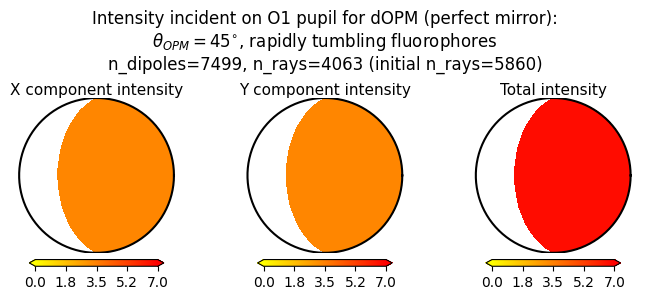

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


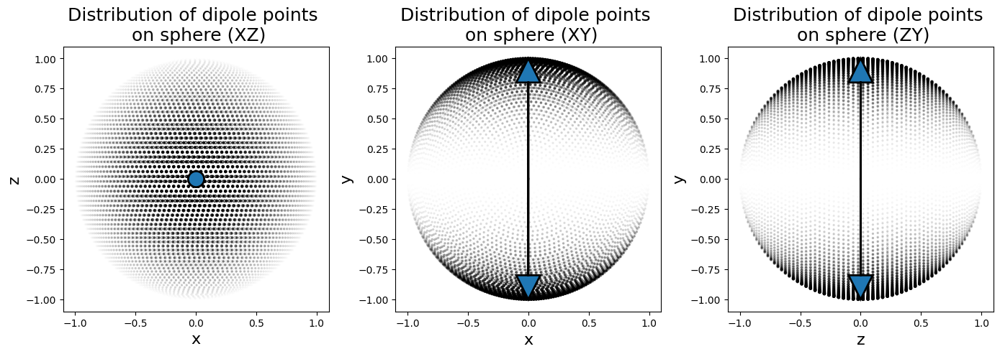

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


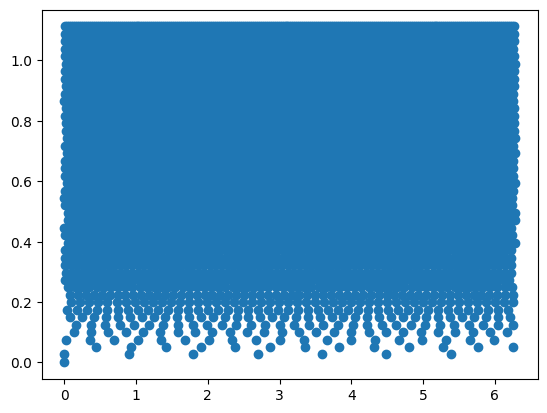

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.397507898300317
initial_energy 0.843768519240068
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 34.171751s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT:

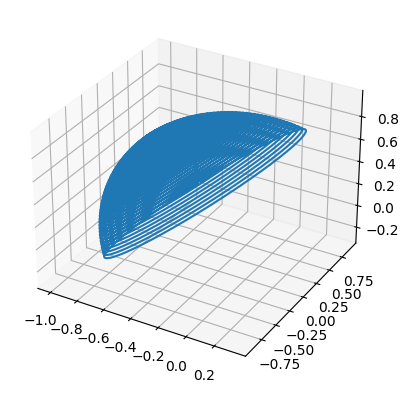

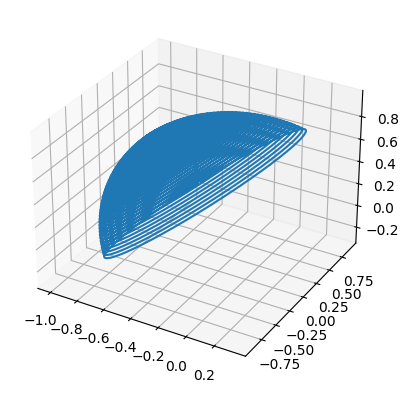

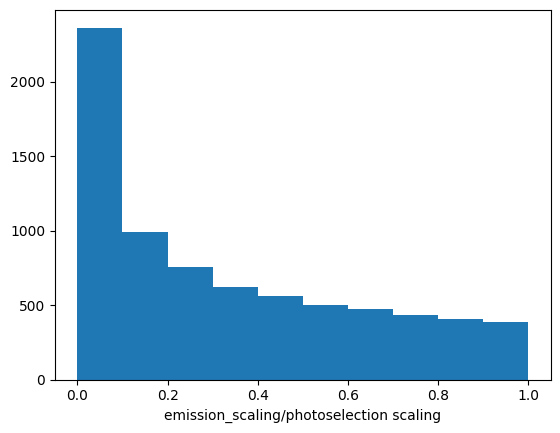

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.4959705179766539
Total energy per dipole per ray: 0.4184843095398908
Energy from Ix 686.1807228576948
Energy from Iy 9.345030562593685e-31
X/Y energy ratio = 7.342733854764916e+32
Half sphere energy 1.397507898300317
Initial energy 0.843768519240068
half sphere energy NA 0.794900347928106
maxr 0.004
1797 escaped out of 5860
Saved checkpoint with 10000 rays
1797 escaped out of 5860
time in trace_rays 62.499576s
ray count 4063
max Ix 6.376207550559681
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034111373998256
max_r_reduced 0.00341037895989145 max_r 0.0034111373998256


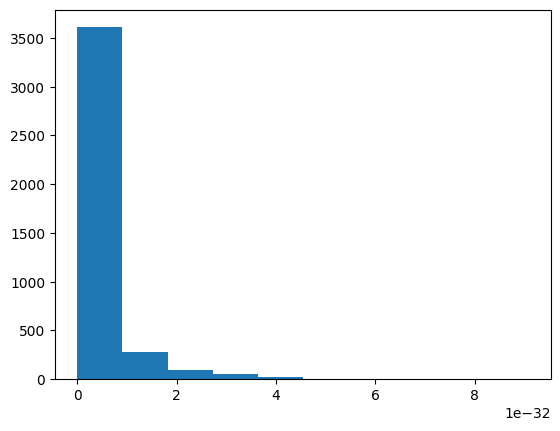

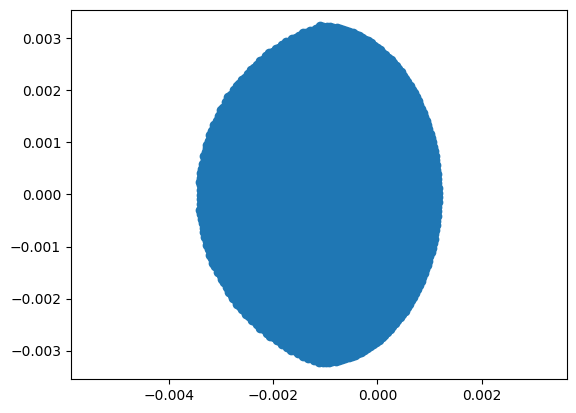

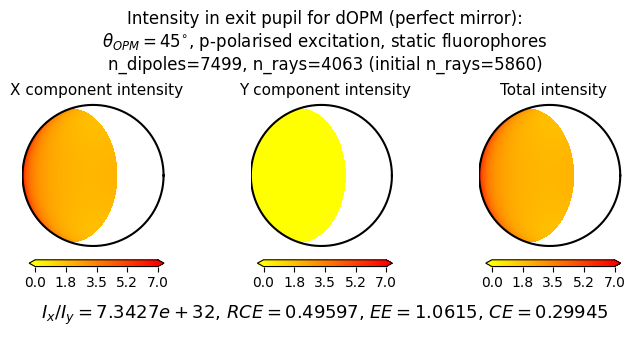

ray count 4063
max Ix 0.7707313751231928
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.896770147912909 max_r 0.896864344434275


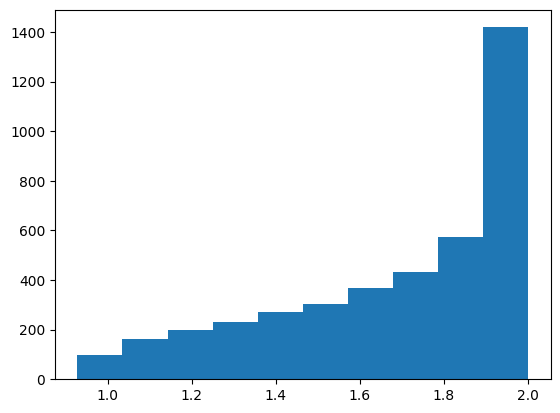

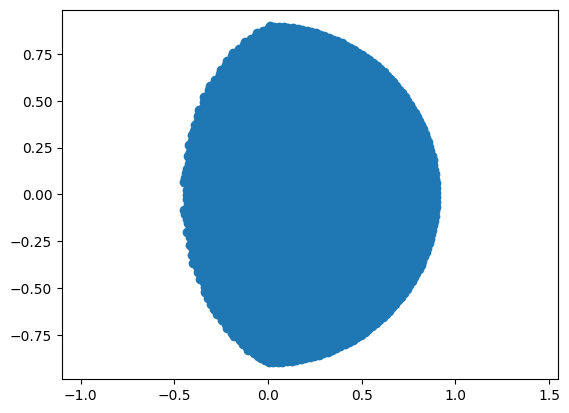

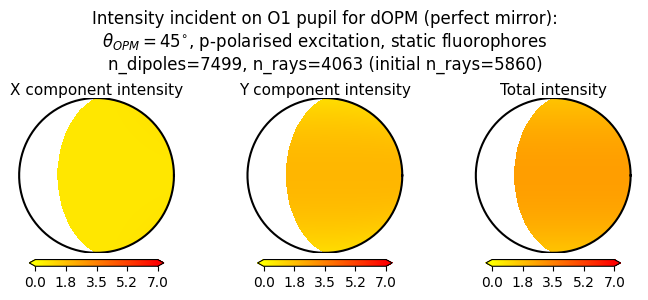

Full sphere generation
cap method area sum 12.564694874875116
expected area sum 6.283185307179586
plot exc arrow


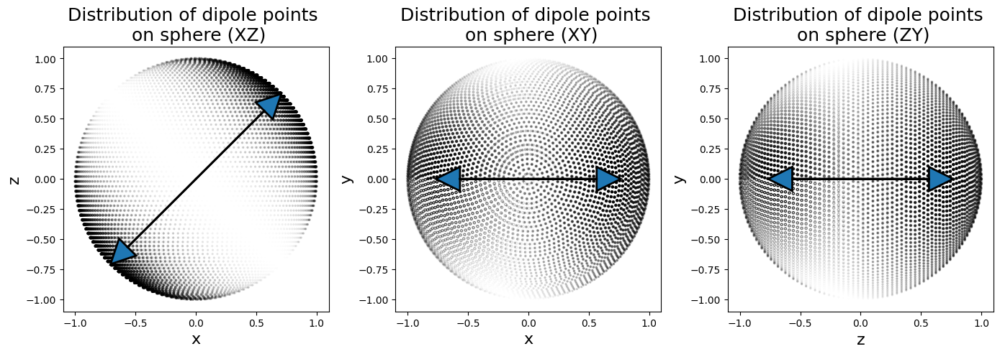

cap method area sum 3.5738661437335946
expected area sum 3.5738661731158983


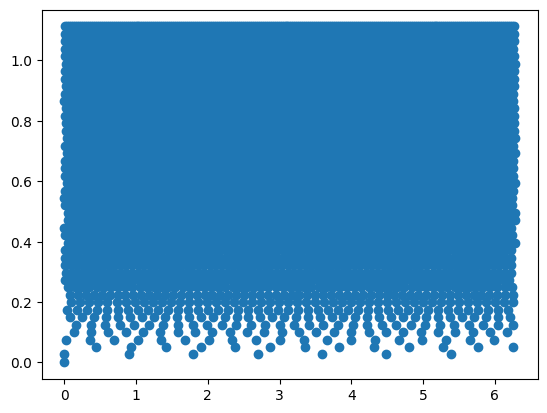

n_dipoles 7499
n_rays 5860
pvec shape (7499, 1, 3)
nvec shape (1, 5860, 3)
(7499, 5860, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
cap method area sum 6.283185277694102
expected area sum 6.283185307179586
n_dipoles 7499
n_rays 10251
pvec shape (7499, 1, 3)
nvec shape (1, 10251, 3)
(7499, 10251, 3, 1)
(7499, 1, 1, 1)
initial energy shape ()
n rays 2pi =  10251
(5860, 3, 1)
n rays =  5860
NA area vs real area? 3.5738661437335946 3.5738661731158983
half_sphere_energy 1.396216507121376
initial_energy 0.7697612404159438
rays when NA scaled up to hemisphere 10302.418842583545
initialisation time in system 31.378868s
Flat pupil
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93FDA7610>
CURVED REFRACTION
max rho curved 0.0029895630965308243
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA8280>
max rho flat 0.003976118918385996
FLAT REFRACTION
ELEMENT: <opmsim.optical_elements.SineLens object at 0x000001C93ECA81C0>
CURVED REFRACTION
max rho curved 0.0
ELEMENT

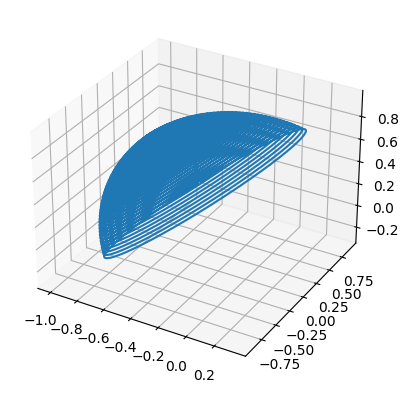

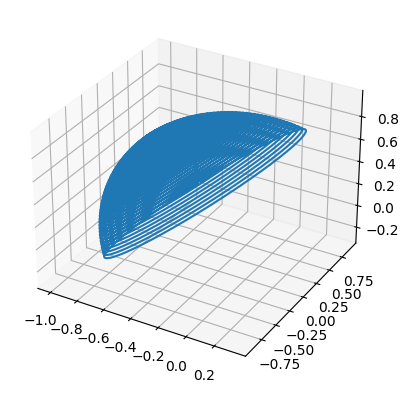

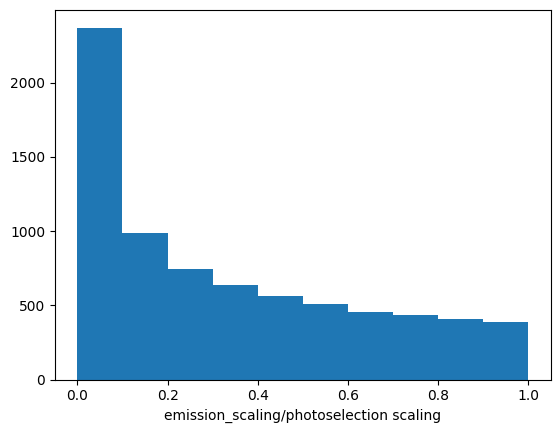

Limiting radius for detector: 0.004
Energy ratio (efficiency): 0.34909341952140227
Total energy per dipole per ray: 0.2687185836318381
Energy from Ix 2.9624398364780914e-30
Energy from Iy 440.6127249179797
X/Y energy ratio = 6.723455018303321e-33
Half sphere energy 1.396216507121376
Initial energy 0.7697612404159438
half sphere energy NA 0.794165806607302
maxr 0.004
1797 escaped out of 5860
Saved checkpoint with 10000 rays
1797 escaped out of 5860
time in trace_rays 61.508775s
ray count 4063
max Ix 3.7247061582566655e-31
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.0034111373998256
max_r_reduced 0.00341037895989145 max_r 0.0034111373998256


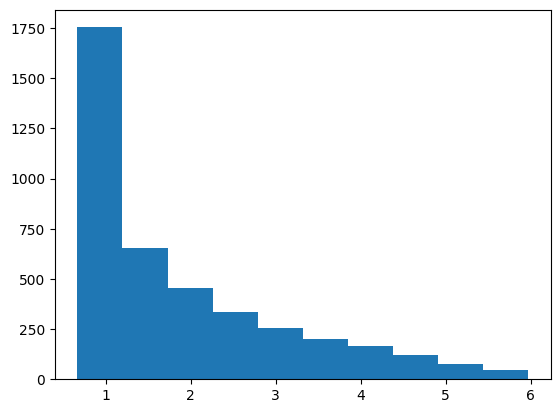

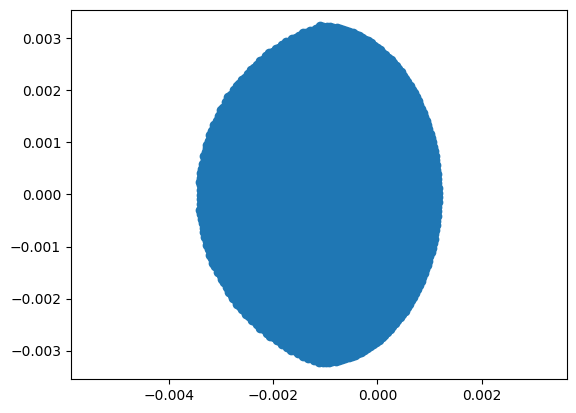

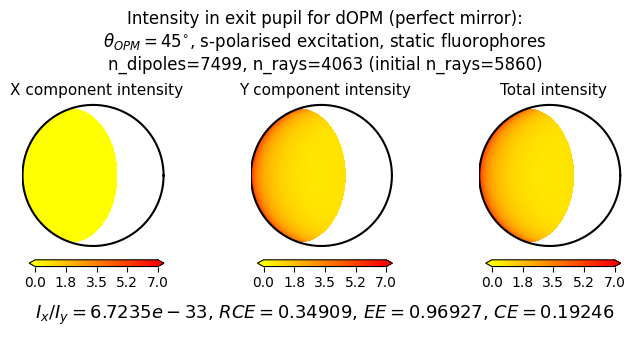

ray count 4063
max Ix 1.8682325055489513
scale range in _plot_unstructured [0, 7, 5]
min for scale 0
max for scale 7
Filling background of polar plot with zeroes!
max_r_in 0 max_r 0.896864344434275
max_r_reduced 0.896770147912909 max_r 0.896864344434275


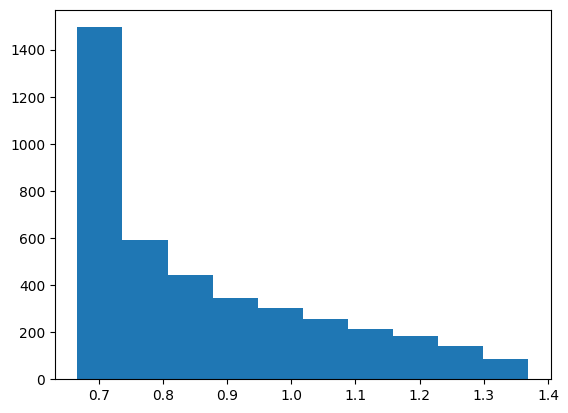

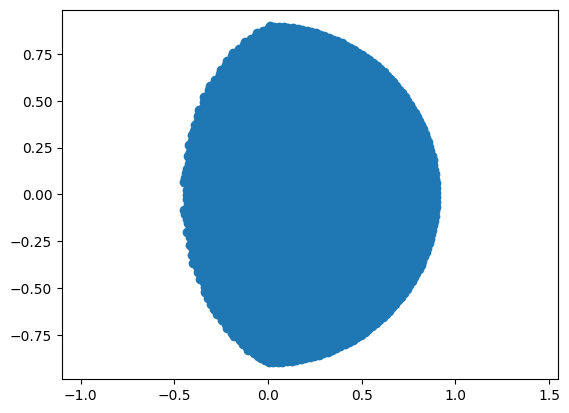

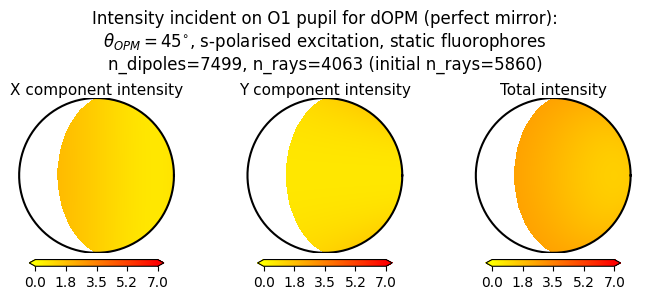

In [16]:
with open(save_details, 'w') as f:
    fs=[el.focal_length for el in elements_fun(0) if type(el).__name__ == 'SineLens']
    f.write(",".join(str(item) for item in fs))

with open(save_filename, 'a') as f:
    film_mats = [film_mat, "perfect"] 
    elements_i = [elements_fun, elements_perf_fun]
    elements_s_i = [elements_s_fun, elements_perf_s_fun]
        
    f.write("angle, film, film_thickess, polarisation, NA1, NA2, RCE, CE, EE\n")
    for i in range(2):  # loop over film and perfect
        film_mat_t = film_mats[i]
        for opm_angle in opm_angles:
            elements = elements_i[i](opm_angle)
            elements_s = elements_s_i[i](opm_angle)
            element_fs = []

            # un/depolarised
            source = dipole_source.DipoleSource()
            source.generate_dipoles(dipole_count)

            system = OpticalSystem("Dual view system (%d degrees) rapid tumbling" % opm_angle, elements, source, options)
            system.trace()
            plot_options['title'] = \
                r'Intensity in exit pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, rapidly tumbling fluorophores' \
                % (film_mat_t, opm_angle)
            pupil_fig = system.detector.plot_pupil(**plot_options_un)
            pupil_fig.savefig(os.path.join(savepath_full, "pupil_plot_tumbling_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight' )

            f.write("%0.1f, %s, %.2E, %s, %.2f, %.2f, %0.5f, %0.5f, %0.5f\n" % 
                (opm_angle, film_mat_t, film_thickness, "unpolarised", NA_O1, NA_O2,
                 system.detector.relative_collection_efficiency,
                 system.detector.emission_efficiency, 
                 system.detector.collection_efficiency)
                )

            plot_options['title'] = \
                r'Intensity incident on O1 pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, rapidly tumbling fluorophores'\
                % (film_mat_t, opm_angle)
            pupil_fig_i = system.initial_detector.plot_pupil(**plot_options_un)
            pupil_fig_i.savefig(os.path.join(savepath_full, "initial_pupil_plot_tumbling_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight' )

            # p-polarised 
            source = dipole_source.DipoleSource()
            source.generate_dipoles(dipole_count)
            source.classical_photoselection(p_pol)

            system = OpticalSystem("Dual view system (%d degrees) p-polarised" % opm_angle, elements, source, options)
            system.trace()
            plot_options['title'] = \
                r'Intensity in exit pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, p-polarised excitation, static fluorophores'\
                % (film_mat_t, opm_angle)
            pupil_fig = system.detector.plot_pupil(**plot_options_p)
            pupil_fig.savefig(os.path.join(savepath_full, "pupil_plot_p-polarised_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight' )

            f.write("%0.1f, %s, %.2E, %s, %.2f, %.2f, %0.5f, %0.5f, %0.5f\n" % 
                (opm_angle, film_mat_t, film_thickness, "p-polarised", NA_O1, NA_O2,
                 system.detector.relative_collection_efficiency,
                 system.detector.emission_efficiency, 
                 system.detector.collection_efficiency)
                )

            plot_options['title'] = \
                r'Intensity incident on O1 pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, p-polarised excitation, static fluorophores'\
                % (film_mat_t, opm_angle)
            pupil_fig_i = system.initial_detector.plot_pupil(**plot_options_p)
            pupil_fig_i.savefig(os.path.join(savepath_full, "initial_pupil_plot_p-polarised_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight')

            # s-polarised
            source = dipole_source.DipoleSource()
            source.generate_dipoles(dipole_count)
            source.classical_photoselection(s_pol(opm_angle))

            system = OpticalSystem("Dual view system (%d degrees) s-polarised" % opm_angle, elements_s, source, options)
            system.trace()
            plot_options['title'] = \
                r'Intensity in exit pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, s-polarised excitation, static fluorophores'\
                % (film_mat_t, opm_angle)
            pupil_fig = system.detector.plot_pupil(**plot_options_s)
            pupil_fig.savefig(os.path.join(savepath_full, "pupil_plot_s-polarised_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight' )

            f.write("%0.1f, %s, %.2E, %s, %.2f, %.2f, %0.5f, %0.5f, %0.5f\n" % 
                (opm_angle, film_mat_t, film_thickness, "s-polarised", NA_O1, NA_O2,
                 system.detector.relative_collection_efficiency,
                 system.detector.emission_efficiency, 
                 system.detector.collection_efficiency)
                )

            plot_options['title'] = \
                r'Intensity incident on O1 pupil for dOPM (%s mirror): $\theta_{OPM}=%d^{\circ}$, s-polarised excitation, static fluorophores'\
                % (film_mat_t, opm_angle)
            pupil_fig_i = system.initial_detector.plot_pupil(**plot_options_s)
            pupil_fig_i.savefig(os.path.join(savepath_full, "initial_pupil_plot_s-polarised_%s_%d.png" % (film_mat_t, opm_angle)), bbox_inches='tight' )

